#### Author: Francesco Carpanini 
#### Student ID: 0001093913 (UNIBO) - 355694 (UNIPR)
#### Electronic Engineering for Intelligent Vehicles (EEIV) - MUNER 

---

# Stereo Robot Navigation

1. **Project's objective** Given a video sequence taken by a stereo camera mounted on a moving vehicle, project’s objective is to sense information concerning the space in front of the vehiclewhich may be deployed by the vehicle navigation system to automatically avoid obstacles.

2. **Project's dataset** The input data consist of a pair of synchronized videos taken by a stereo camera *(robotL.avi, robotR.avi)*, with one video concerning the left view *(robotL.avi)*, the other the right view (robotR.avi). Moreover, the parameters required to estimate distances from stereo images are provided below:
    - focale **f** = 567.2 [pixel]
    - baseline **b** = 92.226 [mm]

3. **Project's functional specifications** Sensing of 3D information related to the obstacles in front of the vehicle should rely on the stereo vision principle. Purposely, students should develop an area-based stereo matching algorithm capable of producing a dense disparity map for each pair of synchronized frames and based on the SAD (Sum of Absolute Differences) dissimilarity measure.
For each pair of candidate corresponding points, the basic stereo matching algorithm consists in comparing the intensities belonging to two squared windows centred at the points. Such a comparison involves computation of either a dissimilarity (e.g. SAD, SSD) or similarity (e.g. NCC, ZNCC) measure between the two windows. As the matching process is carried out on rectified images, once a reference image is chosen (e.g. the left view), the candidates associated with a given point need to be sought for along the same row in the other image (right view) only and, usually, within a certain disparity range which depends on the depth range one wishes to sense. 
Accordingly, given a point in the reference image, the corresponding one in the other image is selected as the candidate minimizing (maximizing) the chosen dissimilarity (similarity) measure between the windows. As such, the parameters of the basic stereo matching algorithm consist in the size of the window and the disparity range. In this project, students should choose the former properly, while the latter is fixed to the interval [0, 128].

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import sys
import time
import math
import os 
import numba
import random
import pickle
from numba import prange 
from joblib import Parallel, delayed
from math import atan, pi, sin, cos, tan

This block is put just to verify which version of OpenCV is installed.

In [2]:
# Verify the OpenCV version
print("OpenCV version:", cv2.__version__)

OpenCV version: 4.10.0


A simple function was created to load videos, in order not to repeat the same code multiple times. 
The OpenCV function used is cv2.VideoCapture, which takes the video path as input and outputs a video object containing all the frames.

In [3]:
def load_videos(folder_path, file_nameL, file_nameR):
    # Open the video files
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    # Check if the video files are opened successfully
    if not videoL.isOpened() or not videoR.isOpened():
        print("Error: Could not open the video files.")
        return None, None
    
    return videoL, videoR

All the constants needed in the project are defined here.
These include the absolute and relative paths of the videos, camera parameters like the baseline between the two cameras and the focal length, as well as the chessboard’s pattern size and its reference height and width.

In [4]:
FOLDER_PATH = "./robot-navigation-video"
FILENAME_L = "robotL.avi"
FILENAME_R = "robotR.avi"

BASELINE = 92.226 # [mm]
FOCAL_LENGTH = 567.2 # [px]

PATTERN_SIZE = (6, 8)
REF_HEIGHT = 178 # [mm]
REF_WIDTH = 125 # [mm]

DSI_RANGE = 128 

DISTANCE_THRESHOLD = 800 # [mm]

STRIPS = 5

In [5]:
def get_properties(video, file_name):
    """
    Prints the properties of a given video file.
    Parameters:
        video (cv2.VideoCapture): The video capture object from which to retrieve properties.
        file_name (str): The name of the video file.
    Returns:
        tuple: A tuple containing the frames per second (fps), width, height, and frame count of the video.None    
    """
    # Get the properties of video
    fps = int(video.get(cv2.CAP_PROP_FPS))
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frame_count = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print("Properties of:", file_name)
    print("FPS:", fps)
    print("Width:", width)
    print("Height:", height)
    print("Frame count:", frame_count)
    
    return fps, width, height, frame_count

In [6]:
videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)

In [7]:
fpsL, widthL, heightL, frame_countL = get_properties(videoL, FILENAME_L)

Properties of: robotL.avi
FPS: 15
Width: 640
Height: 480
Frame count: 389


In [8]:
fpsR, widthR, heightR, frame_countR = get_properties(videoR, FILENAME_R)

Properties of: robotR.avi
FPS: 15
Width: 640
Height: 480
Frame count: 389


In [9]:
def plot_stereo_images(frameL, frameR, titleL="", titleR="", gray=False):
    """
    Plots the left and right stereo images side by side.
    Parameters:
        frameL (np.array): The left stereo image.
        frameR (np.array): The right stereo image.
        titleL (str): The title of the left stereo image.
        titleR (str): The title of the right stereo image.
    """
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    if titleL:
        plt.title(titleL)
    if gray:
        plt.imshow(cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY), cmap='gray')
    else:
        plt.imshow(frameL)

    plt.subplot(1,2,2)
    if titleR:
        plt.title(titleR)
    if gray:
        plt.imshow(cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY), cmap='gray')
    else:
        plt.imshow(frameR)
    plt.show()

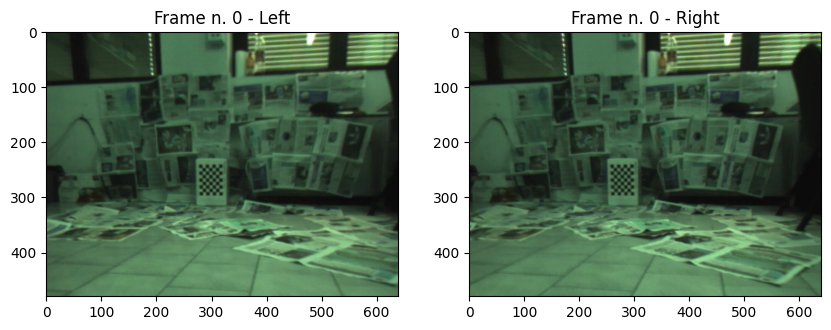

In [10]:
for i in range (0, 30):
    _, frameL = videoL.read()
    _, frameR = videoR.read()

plot_stereo_images(frameL, frameR, "Frame n. 0 - Left", "Frame n. 0 - Right")

The disparity map is calculated in a central area of the reference frame (e.g., a square of 60x60, 80x80, or 100x100 pixels) to measure distances in the area the vehicle would travel if moving straight. 
This was done as requested, comparing different area sizes to the image dimensions. 
It’s only for debugging to better understand the scene and how the selected portion appears in the image.

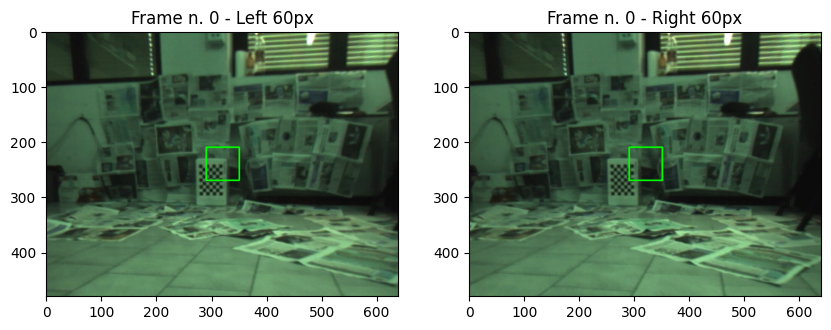

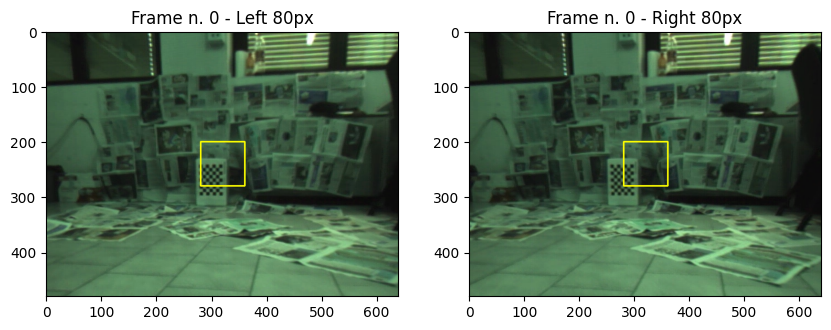

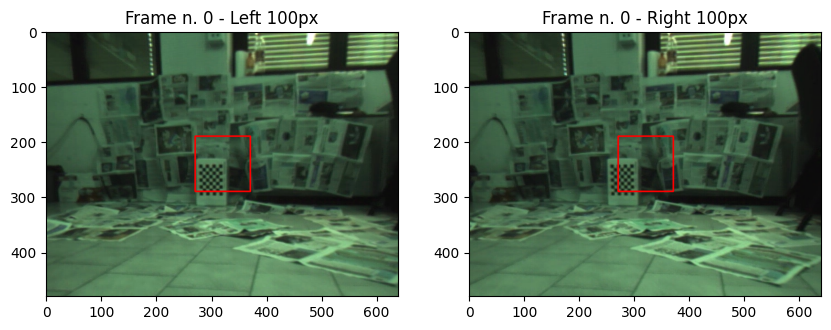

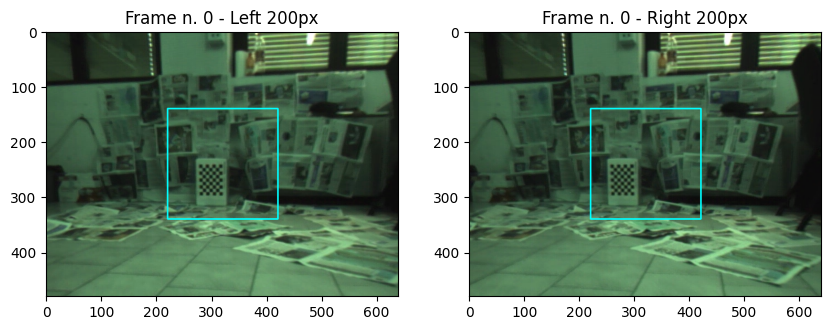

In [11]:
def draw_and_display_rectangle(frameL, frameR, area_size, color, title_suffix):
    x = int(widthL / 2 - area_size / 2)
    y = int(heightL / 2 - area_size / 2)

    frameL_copy = frameL.copy()
    frameR_copy = frameR.copy()

    cv2.rectangle(frameL_copy, (x, y), (x + area_size, y + area_size), color, 2)
    cv2.rectangle(frameR_copy, (x, y), (x + area_size, y + area_size), color, 2)
    
    plot_stereo_images(frameL_copy, frameR_copy, f"Frame n. 0 - Left {title_suffix}", f"Frame n. 0 - Right {title_suffix}")

# Parameters for different area sizes and colors
areas_and_colors = [
    (60, (0, 255, 0), "60px"),
    (80, (255, 255, 0), "80px"),
    (100, (255, 0, 0), "100px"),
    (200, (0, 255, 255), "200px")
]

for area_size, color, title_suffix in areas_and_colors:
    draw_and_display_rectangle(frameL, frameR, area_size, color, title_suffix)

It’s better to use grayscale images for computing disparity, as it requires to consider just one channel. Below, some images are presented to illustrate this concept more clearly.

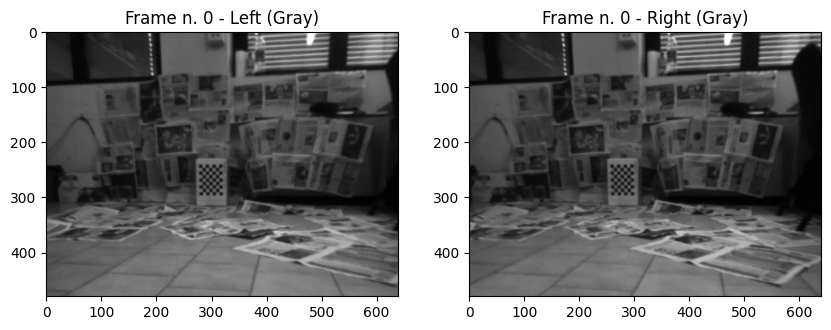

In [12]:
plot_stereo_images(frameL, frameR, "Frame n. 0 - Left (Gray)", "Frame n. 0 - Right (Gray)", gray=True)

The first method explored to calculate disparity is the SAD method, short for "Sum of Absolute Differences." 
This method measures the dissimilarity between blocks of pixels in two stereo and rectified images. 

It calculates the disparity by taking the absolute difference between each pixel in a reference block and its corresponding pixel in a comparison block.

When calculating a disparity map, SAD compares the intensity values at corresponding points in two rectified images to determine differences. A positive result means differences exist between pixels; the higher the value, the greater the difference. 
A zero value indicates no differences.

Here is reported the formula:

$$ SAD (i,j) = \sum_{m=0}^{M-1} \sum_{n=0}^{N-1} |I(i+m, j+n)-T(m,n)|$$ 

    I(i+m, j+n)     intensity value of the image
    T(m, n)         intensity value of target image      

In [13]:
@numba.njit
def SAD(windowL, windowR):
    """
    Calculate the Sum of Absolute Differences (SAD) between two windows.
    This function is optimized using Numba's Just-In-Time (JIT) compilation to enhance performance.

    Args:
        windowL (np-array): The left window, a 2D array of pixel values.
        windowR (np-array): The right window, a 2D array of pixel values.

    Returns:
        float: The sum of absolute differences between the two windows.
    """
    return np.sum(np.abs(windowL - windowR))

@numba.njit
def compute_disparity_cost_SAD(imageL, imageR, pixel_row, left_pixel_col, right_pixel_col, window_margin):
    """
    Compute the Sum of Absolute Differences (SAD) disparity cost between two image windows.

    Args:
        imageL (np-array): The left image as a 2D numpy array.
        imageR (np-array): The right image as a 2D numpy array.
        pixel_row (int): Row index of the target pixel in both images.
        left_pixel_col (int): Column index of the target pixel in the left image.
        right_pixel_col (int): Column index of the target pixel in the right image.
        window_margin (int): Defines half of the window size around the target pixel. 
                             For a window_margin of n, the window is (2n + 1) x (2n + 1) pixels.

    Returns:
        float: The computed disparity cost using the SAD method.
    """
    # Define the window around the target pixel in the left image
    windowL = imageL[pixel_row - window_margin : pixel_row + window_margin + 1,
                    left_pixel_col - window_margin : left_pixel_col + window_margin + 1]
    
    # Define the corresponding window in the right image at the specified disparity
    windowR = imageR[pixel_row - window_margin : pixel_row + window_margin + 1,
                    right_pixel_col - window_margin : right_pixel_col + window_margin + 1]
    
    # Calculate the matching cost using SAD function
    cost = SAD(windowL, windowR)
    
    return cost

@numba.njit
def compute_disparity_map_SAD(left_image, right_image, max_disparity, block_size):
    """
    Computes the disparity map between a pair of stereo images using the Sum of Absolute Differences (SAD) method.
    Args:
        left_image (np-array): The left image of the stereo pair, assumed to be a 2D grayscale image.
        right_image (np-darray): The right image of the stereo pair, assumed to be a 2D grayscale image.
        max_disparity (int): The maximum disparity to consider when comparing blocks.
        block_size (int): The size of the square block to use for computing the SAD cost. It must be an odd number.
    Returns:
        np-array: A 2D array representing the disparity map, with the same dimensions as the input images.
    """
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    # prange -> parallel loop with Numba  
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('inf') # Initialize the minimum cost as positive infinity
            best_disparity = 0  # Initialize the best disparity 
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_SAD(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    if cost < min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Store the best disparity for the current pixel in the disparity map
            disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_SAD(i, folder_path, file_nameL, file_nameR, dsi_range, window_size):
    """
    Processes a specific frame from two video files to compute the disparity map using the Sum of Absolute Differences (SAD) method.
    Args:
        i (int): The frame index to process.
        folder_path (str): The path to the folder containing the video files.
        file_nameL (str): The filename of the left video.
        file_nameR (str): The filename of the right video.
        dsi_range (int): The range of disparity values to consider.
        window_size (int): The size of the window to use for the SAD computation. It must be an odd number.
    Returns:
        np-array: The computed disparity map for the specified frame.
    """
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_SAD(frameL_gray, frameR_gray, dsi_range, window_size)
    return dsi 

The second approach also uses a dissimilarity function, called SSD, which stands for "Sum of Squared Differences." 
SSD calculates how different two image blocks are by summing the squared differences between corresponding pixels. 
This method helps find the best match between blocks, minimizing the difference from the original data. 

The formula is:

$$ SSD (i,j) = \sum_{m=0}^{M-1} \sum_{n=0}^{N-1} (I (i+m, j+n)-T(m,n))^2 $$


    I(i+m, j+n)     intensity value of the image
    T(m, n)         intensity value of the target image

Even if just one function could be made for all the methos in order to save code-lines, it was preferred to repeat the whole approach in order to be able to optimize and compile the functions with Numba, in this way the computational times were reduced. 

In [14]:
@numba.njit
def SSD(windowL, windowR):
    """
    Calculates the Sum of Squared Differences (SSD) between two windows.

    Args:
        windowL (np-array): The left window, a 2D array of pixel values.
        windowR (np-array): The right window, a 2D array of pixel values.

    Returns:
        float: The sum of squared differences between the two windows.
    """
    return np.sum((windowL - windowR)**2)

@numba.njit
def compute_disparity_cost_SSD(imageL, imageR, pixel_row, left_pixel_col, right_pixel_col, window_margin):
    """
    Compute the Sum of Squared Differences (SSD) disparity cost between two image windows.

    Args:
        imageL (np-array): The left image as a 2D numpy array.
        imageR (np-array): The right image as a 2D numpy array.
        pixel_row (int): Row index of the target pixel in both images.
        left_pixel_col (int): Column index of the target pixel in the left image.
        right_pixel_col (int): Column index of the target pixel in the right image.
        window_margin (int): Defines half of the window size around the target pixel. 
                             For a window_margin of n, the window is (2n + 1) x (2n + 1) pixels.

    Returns:
        float: The computed disparity cost using the SSD method.
    """
    # Define the window around the target pixel in the left image
    windowL = imageL[pixel_row - window_margin : pixel_row + window_margin + 1,
                    left_pixel_col - window_margin : left_pixel_col + window_margin + 1]
    
    # Define the corresponding window in the right image at the specified disparity
    windowR = imageR[pixel_row - window_margin : pixel_row + window_margin + 1,
                    right_pixel_col - window_margin : right_pixel_col + window_margin + 1]
    
    # Calculate the matching cost using SSD function
    cost = SSD(windowL, windowR)
    
    return cost

@numba.njit
def compute_disparity_map_SSD(left_image, right_image, max_disparity, block_size):
    """
    Computes the disparity map between a pair of stereo images using the SSD method.
    Args:
        left_image (np-array): The left image of the stereo pair, assumed to be a 2D grayscale image.
        right_image (np-darray): The right image of the stereo pair, assumed to be a 2D grayscale image.
        max_disparity (int): The maximum disparity to consider when comparing blocks.
        block_size (int): The size of the square block to use for computing the SSD cost. It must be an odd number.
    Returns:
        np-array: A 2D array representing the disparity map, with the same dimensions as the input images.
    """
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('inf') # Initialize the minimum cost as positive infinity
            best_disparity = 0  # Initialize the best disparity
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_SSD(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    if cost < min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Store the best disparity for the current pixel in the disparity map
            disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_SSD(i, folder_path, file_nameL, file_nameR, dsi_range, window_size):
    """
    Processes a specific frame from two video files to compute the disparity map using the (SSD) method.
    Args:
        i (int): The frame index to process.
        folder_path (str): The path to the folder containing the video files.
        file_nameL (str): The filename of the left video.
        file_nameR (str): The filename of the right video.
        dsi_range (int): The range of disparity values to consider.
        window_size (int): The size of the window to use for the SSD computation. It must be an odd number.
    Returns:
        np-array: The computed disparity map for the specified frame.
    """
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_SSD(frameL_gray, frameR_gray, dsi_range, window_size)
    return dsi 

Normalized Cross-Correlation (NCC) is a method to measure how similar two image regions are, even if they have different brightness or contrast. It normalizes the comparison, giving values between -1 and 1:

    1 means a perfect match,
    -1 means a perfect negative match,
    0 (or values close to that) means low similarity.
To calculate NCC, we first convert pixel values to a 0–1 range, then sum up the product of corresponding pixel intensities between the two regions. This product is divided by the square root of the squared pixel intensities in each region, normalizing the result. The formula is:

$$ NCC(i,j)=\frac{\sum_{m=0}^{M-1} \sum_{n=0}^{N-1} I (i+m, j+n)\cdot T(m,n)}{\sqrt{\sum_{m=0}^{M-1} \sum_{n=0}^{N-1} I (i+m, j+n)^2}\cdot \sqrt{\sum_{m=0}^{M-1} \sum_{n=0}^{N-1} T(m,n)^2}} $$

    I(i+m, j+n)     intensity value of the image
    T(m, n)         intensity value of the target image

In the simplified NCC, the image region is assumed to be a scaled version of the template. Here, the formula essentially finds the cosine of the angle between the two intensity vectors.
The numerator computes the dot product between the vector T and the constant value I(i,j). The denominator normalizes the result by dividing the numerator by the product of the norms of I(i,j) and T.

This indicates how aligned two vectors are with each other by computing the projection of the first on the second. 

$$ NCC(i,j)=\frac{\tilde I(i,j)\cdot T}{|\tilde I(i,j)|\cdot|T|}=\frac{\tilde I(i,j)\cdot |T| \cdot cos \theta}{|\tilde I(i,j)|\cdot|T|}=cos\theta $$

In [15]:
@numba.njit
def NCC(windowL, windowR):
    """
    Compute the Normalized Cross-Correlation (NCC) between two windows.

    Args:
        windowL (np-array): The left window, a 2D array of pixel values.
        windowR (np-array): The right window, a 2D array of pixel values.

    Returns:
        float: The NCC value between the two windows, ranging from -1 to 1.
    """
    # Normalize the two windows
    windowL = windowL/255
    windowR = windowR/255
    return np.sum(windowL * windowR) / (np.sqrt(np.sum(windowL**2)) * np.sqrt(np.sum(windowR**2)))

@numba.njit
def compute_disparity_cost_NCC(imageL, imageR, pixel_row, left_pixel_col, right_pixel_col, window_margin):
    """
    Compute the Normalized Cross-Correlation (NCC) disparity cost between two image windows.

    Args:
        imageL (np-array): The left image as a 2D numpy array.
        imageR (np-array): The right image as a 2D numpy array.
        pixel_row (int): Row index of the target pixel in both images.
        left_pixel_col (int): Column index of the target pixel in the left image.
        right_pixel_col (int): Column index of the target pixel in the right image.
        window_margin (int): Defines half of the window size around the target pixel. 
                             For a window_margin of n, the window is (2n + 1) x (2n + 1) pixels.

    Returns:
        float: The computed disparity cost using the NCC method.
    """
    # Define the window around the target pixel in the left image
    windowL = imageL[pixel_row - window_margin : pixel_row + window_margin + 1,
                    left_pixel_col - window_margin : left_pixel_col + window_margin + 1]
    
    # Define the corresponding window in the right image at the specified disparity
    windowR = imageR[pixel_row - window_margin : pixel_row + window_margin + 1,
                    right_pixel_col - window_margin : right_pixel_col + window_margin + 1]
    
    # Calculate the matching cost using NCC function
    cost = NCC(windowL, windowR)
    
    return cost

@numba.njit
def compute_disparity_map_NCC(left_image, right_image, max_disparity, block_size):
    """
    Computes the disparity map between a pair of stereo images using the NCC method.
    Args:
        left_image (np-array): The left image of the stereo pair, assumed to be a 2D grayscale image.
        right_image (np-darray): The right image of the stereo pair, assumed to be a 2D grayscale image.
        max_disparity (int): The maximum disparity to consider when comparing blocks.
        block_size (int): The size of the square block to use for computing the SSD cost. It must be an odd number.
    Returns:
        np-array: A 2D array representing the disparity map, with the same dimensions as the input images.
    """
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('-inf') # Initialize the minimum cost as negative infinity
            best_disparity = 0  # Initialize the best disparity (shift between left and right image)
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_NCC(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    # Update the best disparity if the cost is higher (the opposite of SAD/SSD)
                    if cost > min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Store the best disparity for the current pixel in the disparity map
            disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_NCC(i, folder_path, file_nameL, file_nameR, dsi_range, window_size):
    """
    Processes a specific frame from two video files to compute the disparity map using the NCC method.
    Args:
        i (int): The frame index to process.
        folder_path (str): The path to the folder containing the video files.
        file_nameL (str): The filename of the left video.
        file_nameR (str): The filename of the right video.
        dsi_range (int): The range of disparity values to consider.
        window_size (int): The size of the window to use for the NCC computation. It must be an odd number.
    Returns:
        np-array: The computed disparity map for the specified frame.
    """
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_NCC(frameL_gray, frameR_gray, dsi_range, window_size)
    return dsi 

Zero-mean Normalized Cross-Correlation (ZNCC) is a variation of the Normalized Cross-Correlation (NCC) that adjusts for the zero-mean property of image windows. By normalizing the images and subtracting their local means, ZNCC is more robust to variations in brightness and lighting. 
This makes it particularly powerful when dealing with images that may have different illumination conditions.

The formula for ZNCC can be expressed as follows:
$$ ZNCC(i,j)=\frac{\sum_{m=0}^{M-1} \sum_{n=0}^{N-1} (I (i+m, j+n) - \mu (\tilde I)) \cdot (T(m,n)-\mu(T))}{\sqrt{\sum_{m=0}^{M-1} \sum_{n=0}^{N-1} (I (i+m, j+n)-\mu(\tilde I))^2}\cdot \sqrt{\sum_{m=0}^{M-1} \sum_{n=0}^{N-1} (T(m,n)-\mu(T))^2}} $$

    I(i+m, j+n)     intensity value of the image
    T(m, n)         intensity value of the target image
    mu              mean intensity value of I and T.

Numerator: The numerator calculates the sum of the products of pixel differences from their respective means in both the image window and the template. This measures how the pixel values in both windows vary together.

Denominator: The denominator normalizes the numerator by dividing it by the product of the square roots of the sums of squared differences from the means. This helps to scale the correlation value, making it invariant to changes in brightness or contrast.

Output Values: Similar to NCC, ZNCC produces values ranging from -1 to 1:

    1 means a perfect match,
    -1 means a perfect negative match,
    0 (or values close to that) means low similarity.

In [16]:
@numba.njit
def ZNCC(windowL, windowR):
    """
    Compute the Zero-mean Normalized Cross-Correlation (ZNCC) between two windows.

    ZNCC is a measure of the similarity between two windows, often used in image processing
    for template matching and stereo vision.

    Args:
        windowL (np-array): The left window (template) as a 2D numpy array.
        windowR (np-array): The right window (search area) as a 2D numpy array.

    Returns:
        float: The ZNCC value between the two windows, ranging from -1 to 1.
    """
    windowL = (windowL - np.mean(windowL)) / 255
    windowR = (windowR - np.mean(windowR)) / 255
    # Check for division by zero in the denominator
    if np.sqrt(np.sum(windowL ** 2)) * np.sqrt(np.sum(windowR ** 2)) == 0:
        return 0
    return np.sum(windowL * windowR) / (np.sqrt(np.sum(windowL**2)) * np.sqrt(np.sum(windowR**2)))

@numba.njit
def compute_disparity_cost_ZNCC(imageL, imageR, pixel_row, left_pixel_col, right_pixel_col, window_margin):
    """
    Compute the Normalized Cross-Correlation (ZNCC) disparity cost between two image windows.

    Args:
        imageL (np-array): The left image as a 2D numpy array.
        imageR (np-array): The right image as a 2D numpy array.
        pixel_row (int): Row index of the target pixel in both images.
        left_pixel_col (int): Column index of the target pixel in the left image.
        right_pixel_col (int): Column index of the target pixel in the right image.
        window_margin (int): Defines half of the window size around the target pixel. 
                             For a window_margin of n, the window is (2n + 1) x (2n + 1) pixels.

    Returns:
        float: The computed disparity cost using theZNCC method.
    """
    # Define the window around the target pixel in the left image
    windowL = imageL[pixel_row - window_margin : pixel_row + window_margin + 1,
                    left_pixel_col - window_margin : left_pixel_col + window_margin + 1]
    
    # Define the corresponding window in the right image at the specified disparity
    windowR = imageR[pixel_row - window_margin : pixel_row + window_margin + 1,
                    right_pixel_col - window_margin : right_pixel_col + window_margin + 1]
    
    # Calculate the matching cost using NCC function
    cost = ZNCC(windowL, windowR)
    
    return cost

@numba.njit
def compute_disparity_map_ZNCC(left_image, right_image, max_disparity, block_size):
    """
    Computes the disparity map between a pair of stereo images using the ZNCC method.
    Args:
        left_image (np-array): The left image of the stereo pair, assumed to be a 2D grayscale image.
        right_image (np-darray): The right image of the stereo pair, assumed to be a 2D grayscale image.
        max_disparity (int): The maximum disparity to consider when comparing blocks.
        block_size (int): The size of the square block to use for computing the SSD cost. It must be an odd number.
    Returns:
        np-array: A 2D array representing the disparity map, with the same dimensions as the input images.
    """
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('-inf') # Initialize the minimum cost as negative infinity
            best_disparity = 0  # Initialize the best disparity (shift between left and right image)
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_ZNCC(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    # Update the best disparity if the cost is higher (the opposite of SAD/SSD)
                    if cost > min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Store the best disparity for the current pixel in the disparity map
            disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_ZNCC(i, folder_path, file_nameL, file_nameR, dsi_range, window_size):
    """
    Processes a specific frame from two video files to compute the disparity map using the ZNCC method.
    Args:
        i (int): The frame index to process.
        folder_path (str): The path to the folder containing the video files.
        file_nameL (str): The filename of the left video.
        file_nameR (str): The filename of the right video.
        dsi_range (int): The range of disparity values to consider.
        window_size (int): The size of the window to use for the ZNCC computation. It must be an odd number.
    Returns:
        np-array: The computed disparity map for the specified frame.
    """
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_ZNCC(frameL_gray, frameR_gray, dsi_range, window_size)
    return dsi 

Disparity maps are computed using various methods and block sizes. If the operation has already been performed (as it takes time), the data is saved and subsequently loaded.

In [17]:
# If the file already exists, load the disparity maps
if os.path.exists('dsi_maps.pkl'):
    with open('dsi_maps.pkl', 'rb') as file:
        # Load disparity maps for each matching function and window size
        dsi_map_SAD_9 = pickle.load(file)
        dsi_map_SSD_9 = pickle.load(file)
        dsi_map_NCC_9 = pickle.load(file)
        dsi_map_ZNCC_9 = pickle.load(file)
        dsi_map_SAD_15 = pickle.load(file)
        dsi_map_SSD_15 = pickle.load(file)
        dsi_map_NCC_15 = pickle.load(file)
        dsi_map_ZNCC_15 = pickle.load(file)
        dsi_map_SAD_21 = pickle.load(file)
        dsi_map_SSD_21 = pickle.load(file)
        dsi_map_NCC_21 = pickle.load(file)
        dsi_map_ZNCC_21 = pickle.load(file)
        dsi_map_SAD_27 = pickle.load(file)
        dsi_map_SSD_27 = pickle.load(file)
        dsi_map_NCC_27 = pickle.load(file)
        dsi_map_ZNCC_27 = pickle.load(file)
else:
    # List of window sizes to process
    window_sizes = [9, 15, 21, 27]

    # Initialize dictionaries to store disparity maps for each window size
    dsi_maps = {}

    # Process each window size
    for window_size in window_sizes:
        # Parallel processing of disparity maps for each method
        dsi_maps[f'SAD_{window_size}'] = Parallel(n_jobs=8)(delayed(process_frame_SAD)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, window_size) for i in range(389))
        dsi_maps[f'SSD_{window_size}'] = Parallel(n_jobs=8)(delayed(process_frame_SSD)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, window_size) for i in range(389))
        dsi_maps[f'NCC_{window_size}'] = Parallel(n_jobs=8)(delayed(process_frame_NCC)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, window_size) for i in range(389))
        dsi_maps[f'ZNCC_{window_size}'] = Parallel(n_jobs=8)(delayed(process_frame_ZNCC)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, window_size) for i in range(389))

    # Save all disparity maps to a file
    with open('dsi_maps.pkl', 'wb') as file:
        for key, dsi_map in dsi_maps.items():
            pickle.dump(dsi_map, file)

In [18]:
def resize_dsi_map(dsi_map, new_size):
    """
    Resize the given disparity space image (DSI) map to a new size by cropping it from the center.

    Args:
        dsi_map (np-array): The input DSI map to be resized.
        new_size (int): The size of the output DSI map.

    Returns:
        (np-array): The resized DSI map cropped from the center.
    """
    # Get the dimensions of the DSI map
    height, width = dsi_map.shape
    
    # Calculate the top-left corner of the new cropped area 
    center_y = height // 2
    center_x = width // 2
    top_left_y = center_y - new_size // 2
    top_left_x = center_x - new_size // 2
    
    return dsi_map[top_left_y:top_left_y + new_size, top_left_x:top_left_x + new_size]

def plot_dsi_maps(dsi_map9, dsi_map15, dsi_map21, dsi_map27, title, i):
    """
    Plots Disparity Space Images (DSI) maps for different window sizes and their central areas.
    
    Args:
        dsi_map9 (np-array): DSI map with window size 9.
        dsi_map15 (np-array): DSI map with window size 15.
        dsi_map21 (np-array): DSI map with window size 21.
        dsi_map27 (np-array): DSI map with window size 27.
        title (str): Title for the entire figure.
        i (int): Index to select the specific DSI map to plot.
    """
    fig, axs = plt.subplots(4, 5, figsize=(15, 10), constrained_layout=True)  
    fig.suptitle(title, fontsize=16)  
    
    # Find the min and max values for the colorbar -> min and max disparity values
    vmin = min(np.min(dsi_map9), np.min(dsi_map15), np.min(dsi_map21), np.min(dsi_map27))
    vmax = max(np.max(dsi_map9), np.max(dsi_map15), np.max(dsi_map21), np.max(dsi_map27))
    
    dsi_maps = [dsi_map9, dsi_map15, dsi_map21, dsi_map27]
    
    window_sizes = [9, 15, 21, 27]
    center_sizes = [200, 100, 80, 60] 
    
    # Plot the full disparity maps and their central areas
    for idx, (dsi_map, win_size) in enumerate(zip(dsi_maps, window_sizes)):
        axs[idx, 0].imshow(dsi_map[i], cmap='jet', vmin=vmin, vmax=vmax)
        axs[idx, 0].set_title(f"Full Disparity - Window {win_size}", fontsize=8)
        
        for j, center_size in enumerate(center_sizes):
            axs[idx, j+1].imshow(resize_dsi_map(dsi_map[i], center_size), cmap='jet', vmin=vmin, vmax=vmax)
            axs[idx, j+1].set_title(f"Central Area {center_size}x{center_size}", fontsize=8)
    
    # Add a colorbar for the disparity values
    cbar = fig.colorbar(axs[0, 0].images[0], ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
    cbar.set_label('Disparity', fontsize=10)

    plt.show()

In this section disparity maps, from selected frames, are plotted to observe their behavior. 
Due to the chosen disparity range, a specific part of the disparity is missing. For this reason, it was opted to compute the disparity for the entire image and then perform the necessary crops. 

From a computational standpoint, if it is required not to produce the entire disparity map, once a crop is selected, it could simply be expanded the border to ensure it remains complete within the chosen region. 
In this way, even with the smallest crops, a resonable amount of values is present. 

This approach was chosen solely for convenience. 

The overall aim is to facilitate analysis and determine which method yields better results.

This section presents the SAD images plotted for two different frames. 
As observed, due to the size of the image and the varying lighting conditions, a small window should be avoided, while a window that is too large tends to overgeneralize, resulting in significant inaccuracies. 
In many cases, a higher disparity value is assigned even when the objects are not close to the cameras.

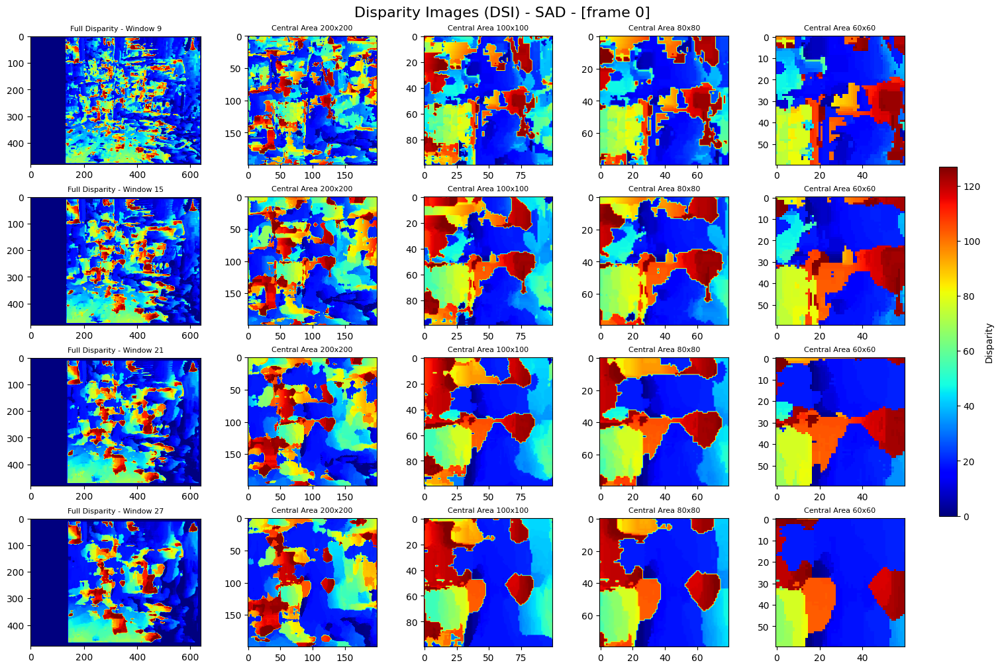

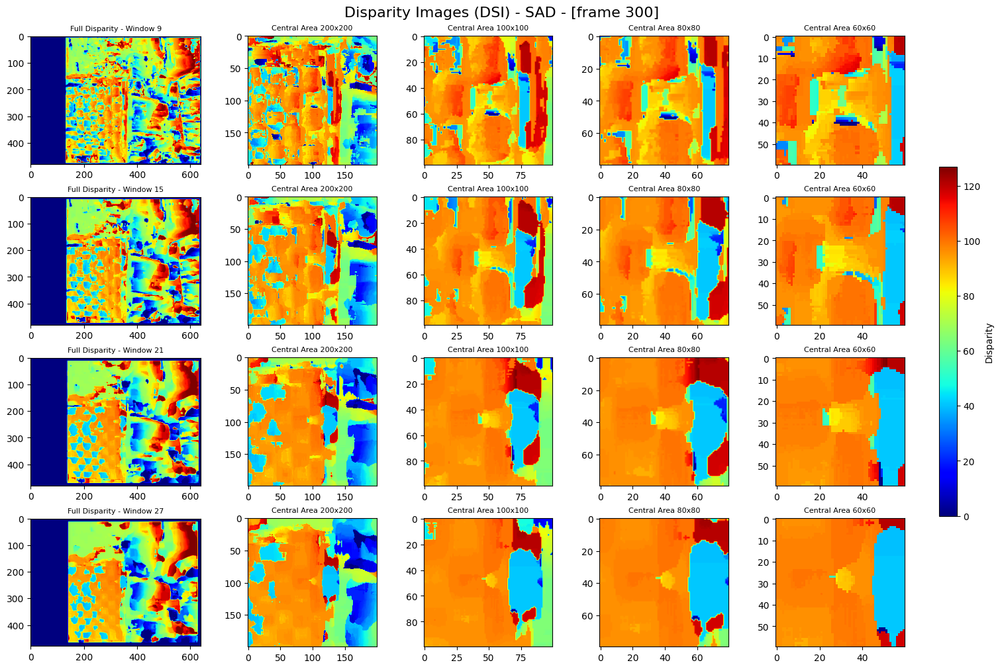

In [19]:
plot_dsi_maps(dsi_map_SAD_9, dsi_map_SAD_15, dsi_map_SAD_21, dsi_map_SAD_27, "Disparity Images (DSI) - SAD - [frame 0]", 0)
plot_dsi_maps(dsi_map_SAD_9, dsi_map_SAD_15, dsi_map_SAD_21, dsi_map_SAD_27, "Disparity Images (DSI) - SAD - [frame 300]", 300)

With SSD, it is evident that the solutions already improve compared to the previous method. There is no need to use a window that is too small, as even a window size of 15 appears to yield good results

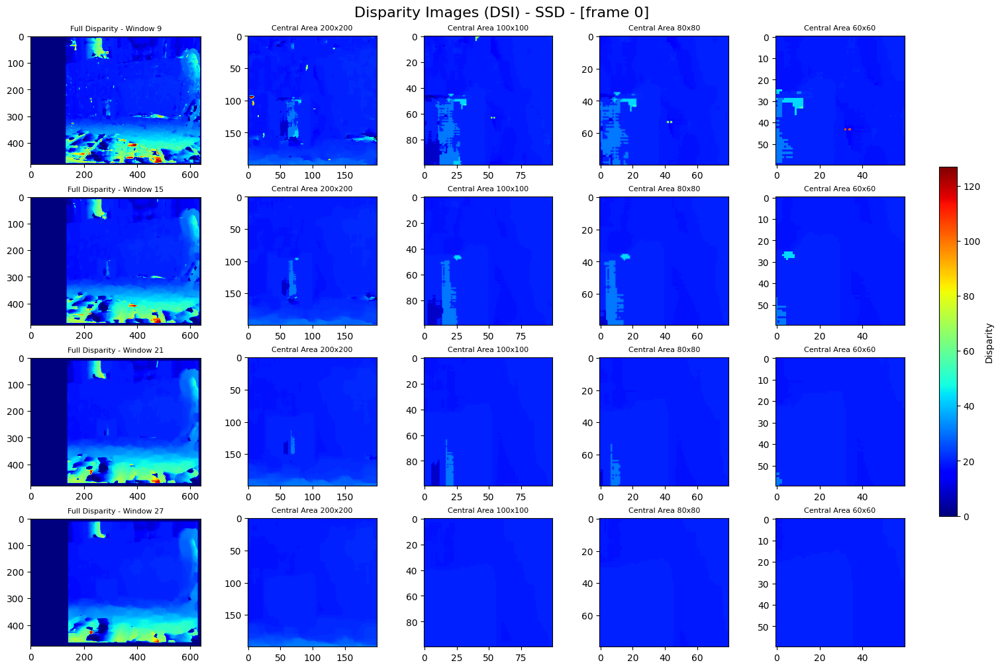

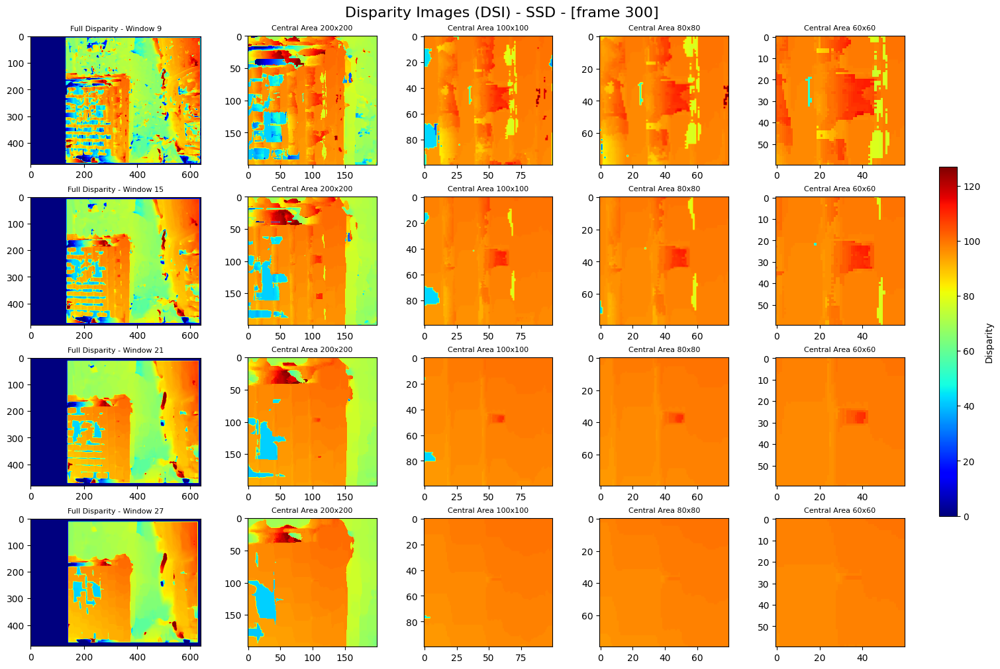

In [20]:
plot_dsi_maps(dsi_map_SSD_9, dsi_map_SSD_15, dsi_map_SSD_21, dsi_map_SSD_27, "Disparity Images (DSI) - SSD - [frame 0]", 0)
plot_dsi_maps(dsi_map_SSD_9, dsi_map_SSD_15, dsi_map_SSD_21, dsi_map_SSD_27, "Disparity Images (DSI) - SSD - [frame 300]", 300)

With NCC, there seems to be an improvement in detail and other aspects, likely because this method is, by definition, more robust than the previous two when dealing with changes in lighting and areas with high contrast, such as very bright regions compared to very dark ones. 
In this case, we consider discarding very small windows that can be misleading in certain scenarios and rely more on a window size of 21, which appears to be the most effective.

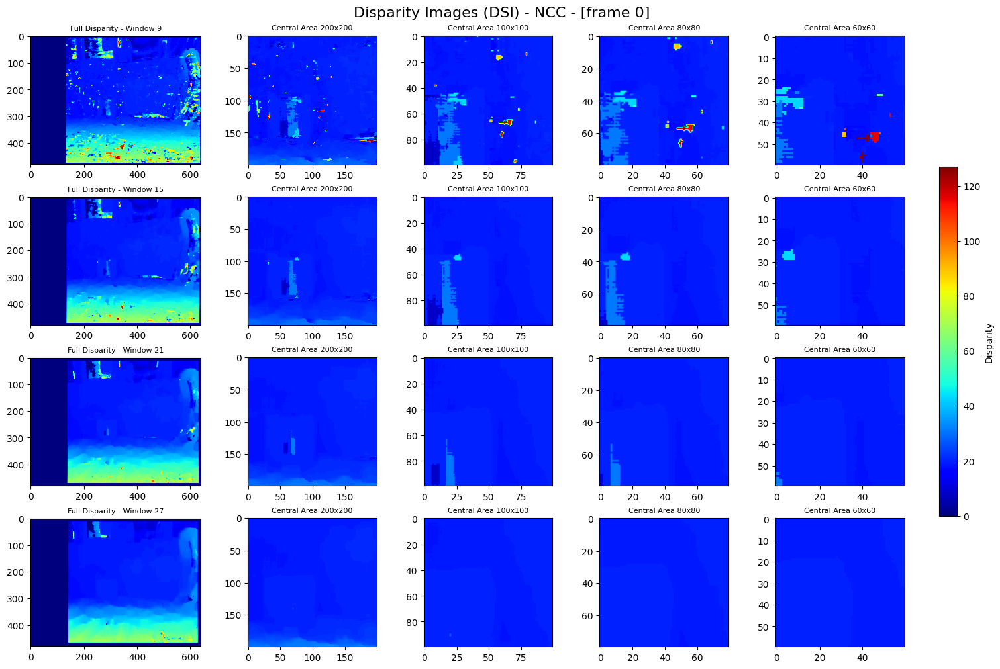

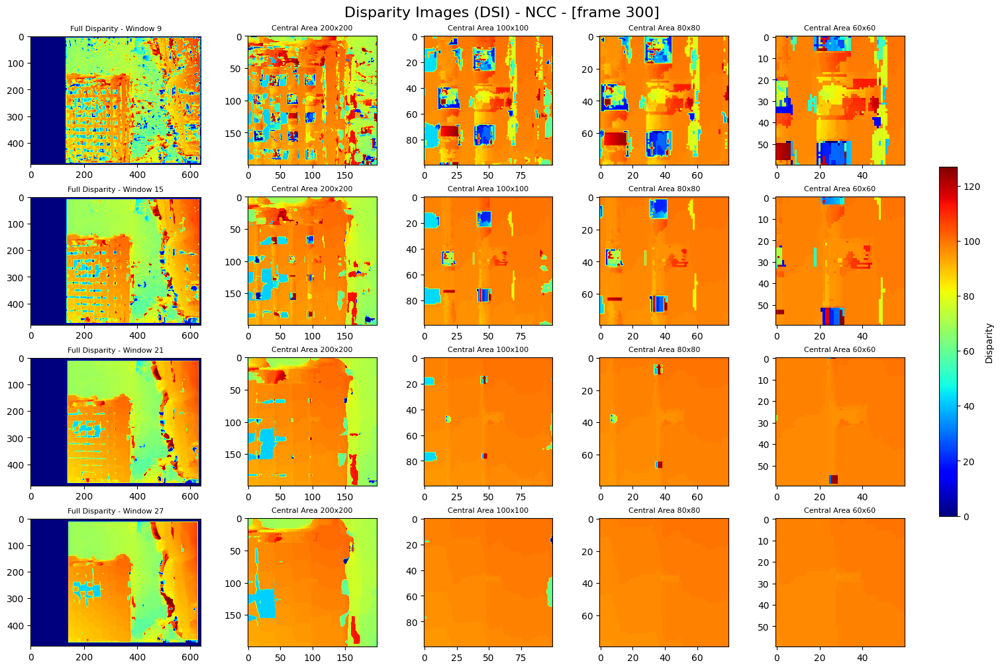

In [21]:
plot_dsi_maps(dsi_map_NCC_9, dsi_map_NCC_15, dsi_map_NCC_21, dsi_map_NCC_27, "Disparity Images (DSI) - NCC - [frame 0]", 0)
plot_dsi_maps(dsi_map_NCC_9, dsi_map_NCC_15, dsi_map_NCC_21, dsi_map_NCC_27, "Disparity Images (DSI) - NCC - [frame 300]", 300)

ZNCC is the method that, by definition, should be more robust against changes in lighting. 
It is evident that, in this case, choosing a very small window does not seem wise, as it does not appear to be computed accurately enough. 
herefore, a larger window size of 21 is also chosen here. 

Initially, this seems to be the most reliable method, yielding the best results; however, further analysis is necessary to reach a definitive conclusion.

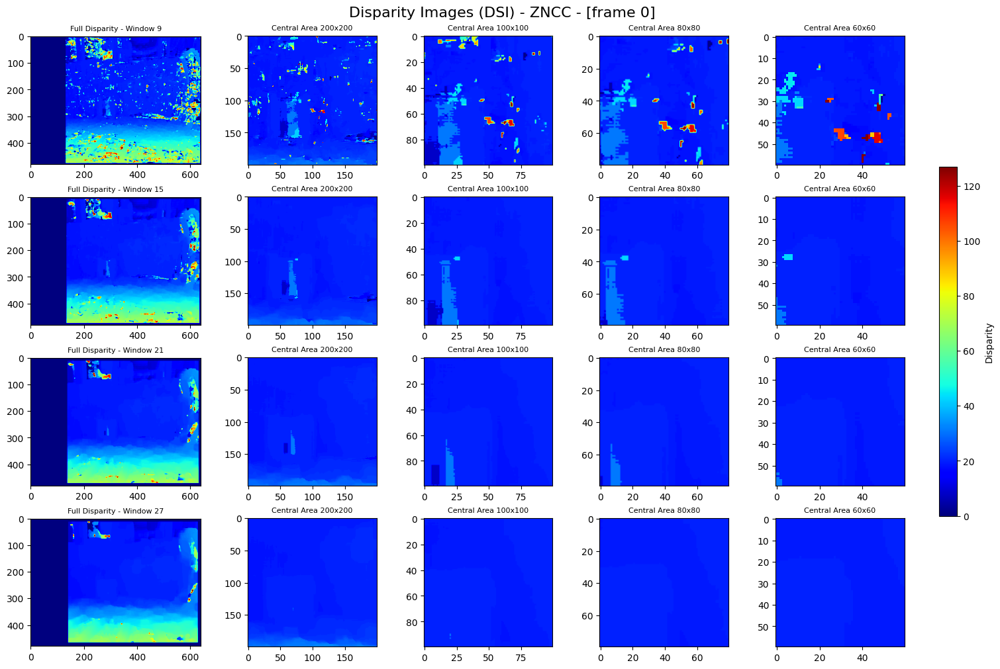

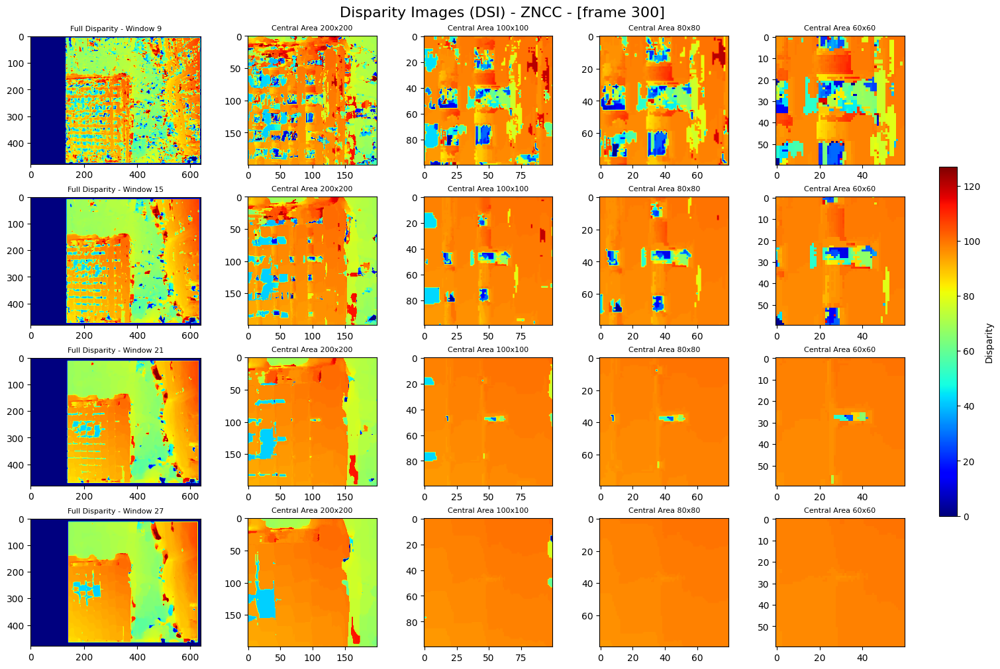

In [22]:
plot_dsi_maps(dsi_map_ZNCC_9, dsi_map_ZNCC_15, dsi_map_ZNCC_21, dsi_map_ZNCC_27, "Disparity Images (DSI) - ZNCC - [frame 0]", 0)
plot_dsi_maps(dsi_map_ZNCC_9, dsi_map_ZNCC_15, dsi_map_ZNCC_21, dsi_map_ZNCC_27, "Disparity Images (DSI) - ZNCC - [frame 300]", 300)

Using the provided parameters (focal length and baseline), it can be got the distance (in mm) of obstacles from the moving vehicle.

$$ z(mm)=\frac {f(pixel)\cdot b(mm)}{dsi(pixel)} $$

    z       Distance 
    f       Physical distance between the two cameras 
    b       Distance between the camera centers (baseline)
    dsi     Disparity 

This formula calculates the distance $z$ in millimeters using standard stereo geometry. 
The depth is directly proportional to the camera's focal length and the horizontal displacement. 
It is based on the principle of triangulation, commonly used in stereo cameras to measure the distance of objects. 

In [23]:
@numba.jit
def get_distance(disparity, focal_length=FOCAL_LENGTH, baseline=BASELINE):
    """
    Calculates the distance from the disparity value.
    Parameters:
        disparity (float): The disparity value.
        focal_length (float): The focal length of the camera.
        baseline (float): The distance between the two cameras.
    Returns:
        float: The distance in meters.
    """
    # Check for zero disparity
    if disparity == 0:
        return None
    
    return focal_length * baseline / disparity

This section outlines the functions that calculate the average and median disparity within the area of interest. 
The average disparity is computed to consider all values, while the median is used to mitigate, hopefully, the influence of outliers that may be present in this type of calculation.

In [24]:
def get_avg_dsi(dsi_map):
    """
    Compute the average disparity value for non-zero values in a DSI (Disparity Space Image) map.
    Args:
        dsi_map (np-array): A 2D array representing the DSI map.
    Returns:
        float: The average disparity value of the non-zero elements in the DSI map. Returns 0 if the DSI map is empty.
    """
    # Check if the DSI map is empty
    if len(dsi_map) == 0:
        return 0
    # Compute the average disparity value for non-zero values
    return np.mean(dsi_map[dsi_map > 0])

def get_med_dsi(dsi_map):
    """
    Compute the median disparity value for non-zero values in a DSI (Disparity Space Image) map.
    Args:
        dsi_map (np-array): A 2D array representing the DSI map.
    Returns:
        float: The median disparity value of the non-zero elements in the DSI map. Returns 0 if the DSI map is empty.
    """
    # Check if the DSI map is empty
    if len(dsi_map) == 0:
        return 0
    # Compute the median disparity value for non-zero values
    return np.median(dsi_map[dsi_map > 0])

def dsi_processing(dsi_dict, dsi_map9, dsi_map15, dsi_map21, dsi_map27, method):
    """
    Processes DSI  maps by calculating average and median values for different window sizes and storing the results in a dictionary.
    For each DSI map, it computes the average and median values of the non-zero elements and stores these in the dictionary.
    """
    # Check if the method is already in the dictionary, otherwise add it
    if method not in dsi_dict:
        dsi_dict[method] = {
            "9": {str(size): {"avg": [], "med": []} for size in ["full", 200, 100, 80, 60]},
            "15": {str(size): {"avg": [], "med": []} for size in ["full", 200, 100, 80, 60]},
            "21": {str(size): {"avg": [], "med": []} for size in ["full", 200, 100, 80, 60]},
            "27": {str(size): {"avg": [], "med": []} for size in ["full", 200, 100, 80, 60]}
        }

    window_sizes = {"9": dsi_map9, "15": dsi_map15, "21": dsi_map21, "27": dsi_map27}

    for win_size, dsi_maps in window_sizes.items():
        for dsi_map in dsi_maps:
            dsi_dict[method][win_size]["full"]["avg"].append(get_avg_dsi(dsi_map[dsi_map > 0]))
            dsi_dict[method][win_size]["full"]["med"].append(get_med_dsi(dsi_map[dsi_map > 0]))
            
            for size in ["200", "100", "80", "60"]:
                dsi_cropped = resize_dsi_map(dsi_map, int(size))
                if len(dsi_cropped) > 0:
                    dsi_dict[method][win_size][size]["avg"].append(get_avg_dsi(dsi_cropped[dsi_cropped > 0]))
                    dsi_dict[method][win_size][size]["med"].append(get_med_dsi(dsi_cropped[dsi_cropped > 0]))

def dist_processing(dsi_dict, baseline=BASELINE, focal_length=FOCAL_LENGTH):
    """
    Processes the disparity values in the DSI dictionary to compute the distance values.
    """
    # Empty dictionary to store the distance values
    dist_dict = {}
    # Compute the distance values for each method, window size, and crop size
    for method, window_sizes in dsi_dict.items():
        dist_dict[method] = {}
        for win_size, crops in window_sizes.items():
            dist_dict[method][win_size] = {}
            for crop_size, metrics in crops.items():
                dist_dict[method][win_size][crop_size] = {
                    "avg": [get_distance(dsi, baseline, focal_length) for dsi in metrics["avg"]],
                    "med": [get_distance(dsi, baseline, focal_length) for dsi in metrics["med"]]
                }
    return dist_dict

compute l'analisi della disparità e della distanza sui diversi blocchi e con i diversi metodi 

In [25]:
dsi_dict = {}

dsi_processing(dsi_dict, dsi_map_SAD_9, dsi_map_SAD_15, dsi_map_SAD_21, dsi_map_SAD_27, "SAD")
dsi_processing(dsi_dict, dsi_map_SSD_9, dsi_map_SSD_15, dsi_map_SSD_21, dsi_map_SSD_27, "SSD")
dsi_processing(dsi_dict, dsi_map_NCC_9, dsi_map_NCC_15, dsi_map_NCC_21, dsi_map_NCC_27, "NCC")
dsi_processing(dsi_dict, dsi_map_ZNCC_9, dsi_map_ZNCC_15, dsi_map_ZNCC_21, dsi_map_ZNCC_27, "ZNCC")


In [26]:
dist_dict = dist_processing(dsi_dict)

In [27]:
def plot_distance_metrics(dist_dict):
    # Extract unique window sizes and crop levels
    window_sizes = list(next(iter(dist_dict.values())).keys())
    crop_levels = ["full", "200", "100", "80", "60"]
    
    # Determine the number of rows and columns for subplots
    num_rows = len(window_sizes)
    num_cols = len(crop_levels)
    
    # Set up the plot grid with an appropriate size
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols, 4 * num_rows))
    
    # Ensure 'axes' is always a 2D array, even for a single row or column
    if num_rows == 1:
        axes = [axes]
    if num_cols == 1:
        axes = [[ax] for ax in axes]
    
    # Iterate over each window size and crop level to create subplots
    for i, window in enumerate(window_sizes):
        for j, crop in enumerate(crop_levels):
            ax = axes[i][j]
            
            # Plot both average (avg) and median (med) distance for each method
            for method in dist_dict.keys():
                # Solid line for average, dashed line for median
                ax.plot(dist_dict[method][window][crop]["avg"], label=f"{method} - avg")
                ax.plot(dist_dict[method][window][crop]["med"], linestyle='--', label=f"{method} - med")
            
            # Set title and labels for the current subplot
            ax.set_title(f"Window: {window}, Crop: {crop}")
            ax.set_xlabel("Frame number")
            ax.set_ylabel("Distance [mm]")
            ax.legend(loc="upper right")  # Display the legend in the top right
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

It can be noted that, as previously highlighted when examining the disparity maps, with SAD there are more issues present. 
Although the trend remains the same, there is a significant bias and a substantial occurrence of errors. 
This problem becomes less apparent when increasing the window size, but it still persists. 

Other methods also appear to be much noisier with a small window; however, with a larger window, the issue seems to resolve, and the computation of distance appears to be consistent with what is observed in the video.

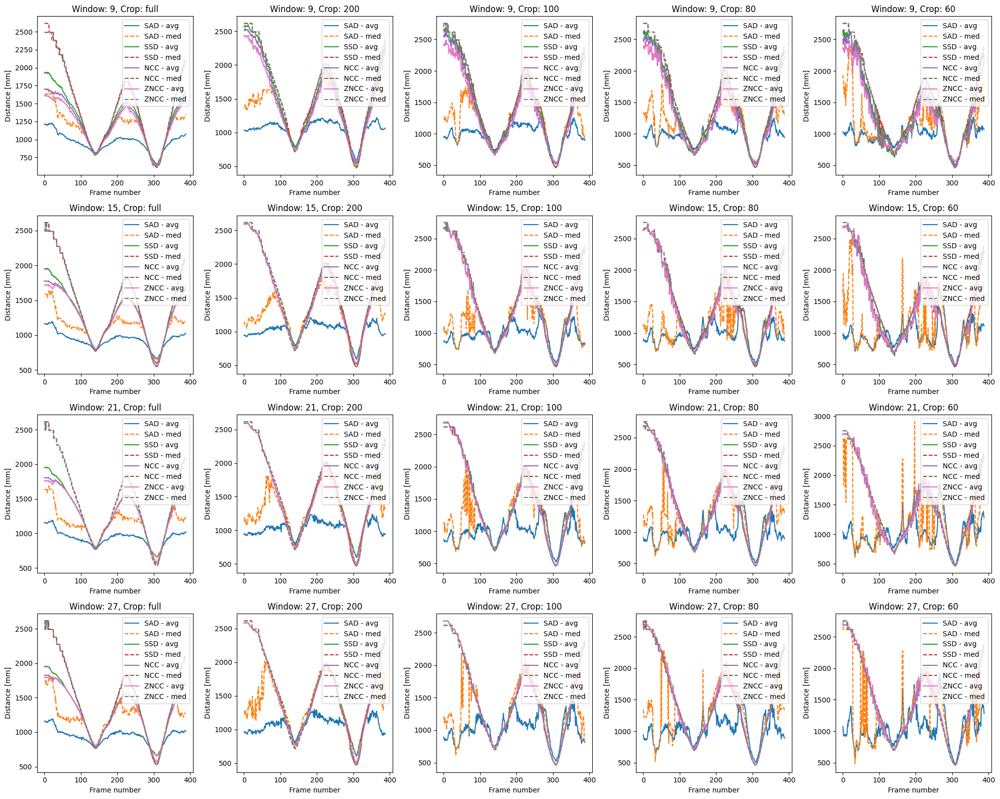

In [28]:
plot_distance_metrics(dist_dict)

In [29]:
def draw_distance_label(frame, distance, threshold):
    """
    Draws a label on the image displaying the distance and a red dot if 
    the distance is below a specified threshold.
    Args:
        frame: The image frame to draw on
        distance: The distance to display (in mm)
        threshold: The threshold below which to display the red dot
    Rreturn: 
        Modified frame with the label and dot (if applicable)
    """
    if frame is None:
        return None  # If frame is None, return None to avoid errors
    
    # Define the position and size of the rectangle
    rect_start = (50, 50)  # Top-left corner of the rectangle
    rect_end = (310, 120)  # Bottom-right corner of the rectangle
    rect_color = (0, 255, 0)  # Rectangle color (green)
    rect_thickness = 4  # Rectangle thickness

    # Draw the rectangle on the image
    cv2.rectangle(frame, rect_start, rect_end, rect_color, rect_thickness)

    # Set font properties
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.65
    font_color = (255, 255, 255)  # White text color
    text = f"distance: {distance:.3f} [m]"

    # Calculate the size of the text to center it
    (text_width, text_height), _ = cv2.getTextSize(text, font, font_scale, 2)
    rect_center_x = (rect_start[0] + rect_end[0]) // 2
    rect_center_y = (rect_start[1] + rect_end[1]) // 2
    text_position = (rect_center_x - text_width // 2, rect_center_y + text_height // 2)

    # Write centered text inside the rectangle
    cv2.putText(frame, text, text_position, font, font_scale, font_color, 2)

    # If the distance is below the threshold, draw a red dot below the label
    if distance < threshold:
        circle_center = (rect_center_x, rect_end[1] + 30)  # Dot position
        circle_radius = 15  # Dot radius
        circle_color = (255, 0, 0)  # Dot color (red)
        cv2.circle(frame, circle_center, circle_radius, circle_color, -1)  # Filled dot

    return frame

def process_and_show_frame_by_index(videoL, videoR, index, distance, threshold):
    """
    Selects the specified frame index, applies the distance label, and displays the frame.
    Args:
        videoL: Left video capture object
        videoR: Right video capture object
        index: Frame index to select
        distance: The distance to display (in mm)
        threshold: Threshold for displaying the red dot
    """
    # Set video to specified frame index
    videoL.set(cv2.CAP_PROP_POS_FRAMES, index)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, index)

    # Read frames from both videos
    retL, frameL = videoL.read()
    retR, frameR = videoR.read()

    # Check if frames were read
    if not retL or not retR:
        print(f"Error: Could not read frame at index {index}. Skipping this frame.")
        return

    # Apply the function to draw the distance label on the left frame
    frameL_with_label = draw_distance_label(frameL, distance, threshold)

    # Display the frame with matplotlib
    return (frameL_with_label)

Both the distance and the threshold have been divided by 100, as specified in the instructions, since this calculation needs to be in meters rather than in millimeters, 
which was the unit used for distance calculations up to this point.

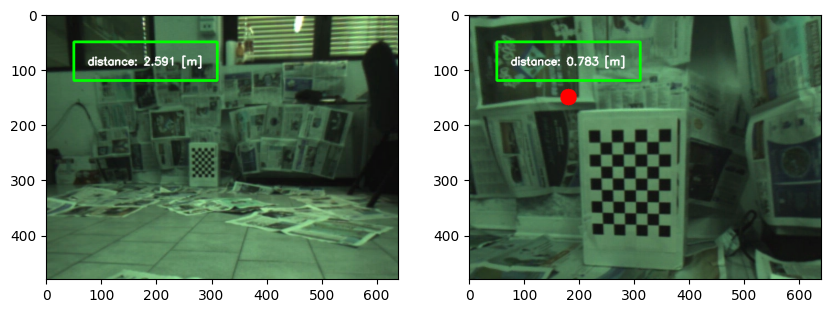

In [30]:
videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)
# Loop through and process specific frames
i = 0
distance = dist_dict["SSD"]["21"]["200"]["avg"][i]
# Process and display the frame at index i
frame1 = process_and_show_frame_by_index(videoL, videoR, i, distance/1000, DISTANCE_THRESHOLD/1000)

i = 140 
distance = dist_dict["SSD"]["21"]["200"]["avg"][i]
# Process and display the frame at index i
frame2 = process_and_show_frame_by_index(videoL, videoR, i, distance/1000, DISTANCE_THRESHOLD/100)

plot_stereo_images(frame1, frame2)

A plot has been created here to show both the distance and the alarm signal over time. The alarm signal is represented as 1 when active and 0 when inactive.

In [31]:
def plot_distance_alarm(dist_dict, method, window_size, crop, threshold=DISTANCE_THRESHOLD, title=""):
    dist_avg = dist_dict[method][window_size][crop]["avg"]
    dist_med = dist_dict[method][window_size][crop]["med"]
    
    # divide by 100 to convert from mm to m
    dist_avg = np.array(dist_avg) / 1000
    dist_med = np.array(dist_med) / 1000
    
    threshold_line = [threshold/1000] * len(dist_avg)
    
    # 4 subplots: avg, med, threshold, and alarm
    fig, axes = plt.subplots(2, 2, figsize=(12, 5), gridspec_kw={'height_ratios': [3, 1]})
    
    # Set a large title above all subplots
    fig.suptitle(title, fontsize=16)

    # Plot the average distance
    axes[0, 0].plot(dist_avg, label="Average Distance", color="orange")
    axes[0, 0].set_title("Average Distance")
    axes[0, 0].set_ylabel("Distance [m]")
    axes[0, 0].legend()
    axes[0, 0].plot(threshold_line, 'r--', label="Threshold")
    
    # Plot the median distance
    axes[0, 1].plot(dist_med, label="Median Distance", color="green")
    axes[0, 1].set_title("Median Distance")
    axes[0, 1].set_ylabel("Distance [m]")
    axes[0, 1].legend()
    axes[0, 1].plot(threshold_line, 'r--', label="Threshold")
    
    # Define the alarm signal for the avg
    alarm_avg = [1 if d < threshold/1000 else 0 for d in dist_avg]
    alarm_med = [1 if d < threshold/1000 else 0 for d in dist_med]
    
    # Plot the alarm signal for the average distance
    axes[1, 0].plot(alarm_avg, 'r', label="Alarm Signal (Average)")
    axes[1, 0].set_ylim(-0.1, 1.1)  # Limit y-axis to show only 0 and 1
    axes[1, 0].set_title("Alarm Signal (Average)")
    axes[1, 0].set_xlabel("Frame number")
    axes[1, 0].legend()

    # Plot the alarm signal for the median distance
    axes[1, 1].plot(alarm_med, 'r', label="Alarm Signal (Median)")
    axes[1, 1].set_ylim(-0.1, 1.1)  # Limit y-axis to show only 0 and 1
    axes[1, 1].set_title("Alarm Signal (Median)")
    axes[1, 1].set_xlabel("Frame number")
    axes[1, 1].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.99])  # Adjust layout to fit the suptitle
    plt.show()

The function’s behavior is represented in the following plots. It was decided analyzing two significant examples.
Results are shown both for cases where the average disparity is considered and for those where the median disparity is used.

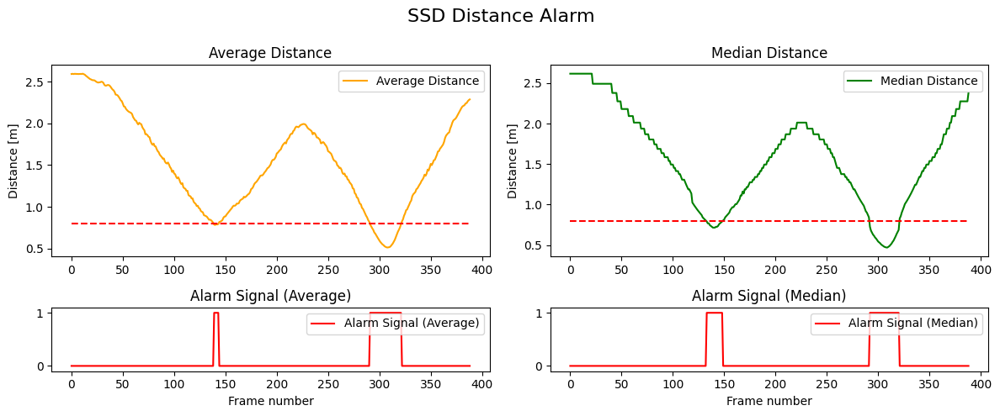

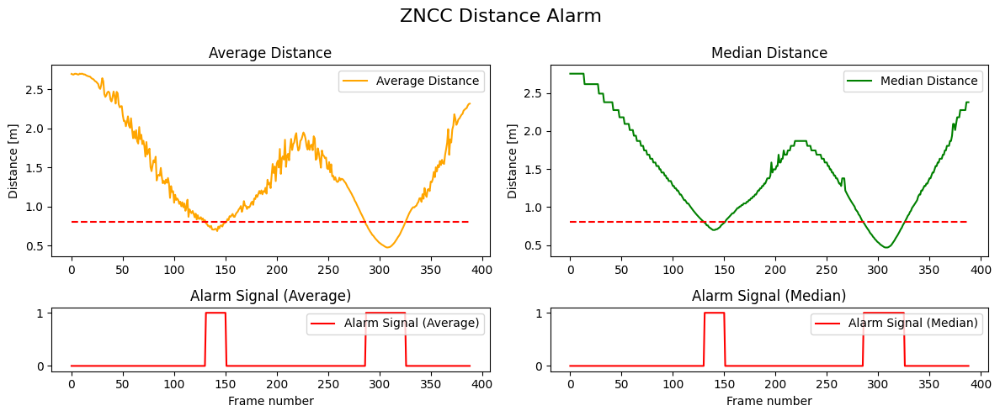

In [32]:
plot_distance_alarm(dist_dict, "SSD", "21", "200", title="SSD Distance Alarm")
plot_distance_alarm(dist_dict, "ZNCC", "21", "60", title="ZNCC Distance Alarm")

Descrivere qui come funziona la funzione per trovare la chessboard, partendo dalla pattern size ecc ecc

In [33]:
# Function to find the corners of the chessboard
def find_chessboard_corners(frame, pattern_size=PATTERN_SIZE):
    # Convert frame to grayscale if needed
    if len(frame.shape) > 2:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    else:
        gray = frame
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, pattern_size, None)
    if ret:
        # Reshape and return corners if found
        return corners.reshape(-1, 2)
    return None

# Function to crop the chessboard based on the found corners
def crop_chessboard(frame, corners):
    if corners is not None:
        # Get min and max x, y coordinates from corners
        x_min, y_min = corners.min(axis=0)
        x_max, y_max = corners.max(axis=0)
        # Crop the frame based on the chessboard region
        return frame[int(y_min):int(y_max), int(x_min):int(x_max)]
    return None

In this are two main functions could be used: cv2.findChessboardCorners and cv2.drawChessboardCorners.
They are present in the openCV library because they are essential in computer vision, especially in applications involving camera calibration with chessboard patterns.

1. cv2.findChessboardCorners
This function is used to detect the internal corners of a chessboard pattern in an image. It was tested that even by swapping the pattern-size the result remain the same. 

2. cv2.drawChessboardCorners
This function is used to visualize the corners detected by cv2.findChessboardCorners by drawing them on the original image. It’s a way to verify if the corners were correctly detected and located.

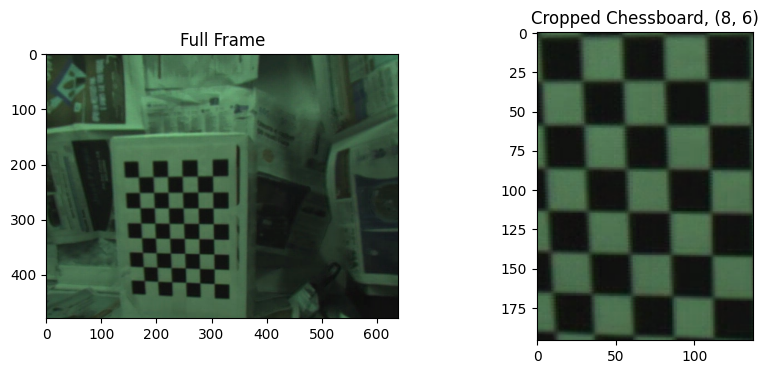

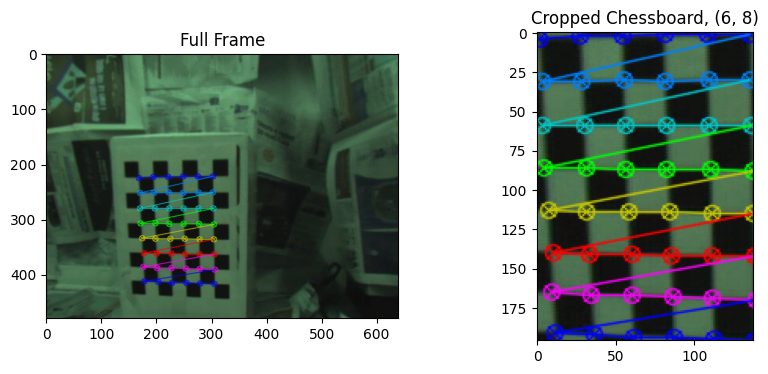

In [34]:
videoL, _ = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)
videoL.set(cv2.CAP_PROP_POS_FRAMES, 300)
_, frameL = videoL.read()

# Find the chessboard corners in the left frame
corners = find_chessboard_corners(frameL, (8, 6))
chessboard = crop_chessboard(frameL, corners)
# Display the original frame and the cropped chessboard
plot_stereo_images(frameL, chessboard, "Full Frame", "Cropped Chessboard, (8, 6)")

videoL.set(cv2.CAP_PROP_POS_FRAMES, 300)
# Find the chessboard corners in the left frame
corners = find_chessboard_corners(frameL, (6, 8))
chessboard = crop_chessboard(frameL, corners)
# Display the original frame and the cropped chessboard
cv2.drawChessboardCorners(frameL, PATTERN_SIZE, corners, True)
plot_stereo_images(frameL, chessboard, "Full Frame", "Cropped Chessboard, (6, 8)")

In this section, several functions are created. 
The first function isolates a Region of Interest (ROI) where only the central portions retain valid values, while the rest are set to zero. 
Additional functions are then used to calculate the height and width of the chessboard by leveraging disparity values, which provide distance information, along with pixel dimensions. 

Furthermore, functions are included for error calculation, given that the real dimensions of the object being viewed are known.

In [35]:
def roi_mask(frame_list, size):
    # List to store frames with applied mask
    frame_list_new = []
    for frame in frame_list:
        # Create a size x size square mask centered in the middle of the frame
        height, width = frame.shape[:2]
        x = (width - size) // 2
        y = (height - size) // 2
        mask = np.zeros_like(frame)
        mask[y:y+size, x:x+size] = 1

        # Apply the mask to the frame
        frame = frame * mask
        frame_list_new.append(frame)
    return frame_list_new

# Function to calculate the height and width of the panel from the chessboard map
def get_height_width(chessboard, focal_length=FOCAL_LENGTH, baseline=BASELINE):
    if chessboard is not None:
        # Calculate average and median DSI values from non-zero regions in chessboard
        avg_dsi = get_avg_dsi(chessboard[chessboard > 0])
        med_dsi = get_med_dsi(chessboard[chessboard > 0])
        
        height_px, width_px = chessboard.shape[:2]
        # Compute height and width based on focal length and DSI values
        if get_distance(avg_dsi, baseline, focal_length) is not None:
            height = get_distance(avg_dsi, baseline, focal_length) * height_px / focal_length
            width = get_distance(avg_dsi, baseline, focal_length) * width_px / focal_length
        else:
            height, width = None, None
        
        if get_distance(med_dsi, baseline, focal_length) is not None:
            height_med = get_distance(med_dsi, baseline, focal_length) * height_px / focal_length
            width_med = get_distance(med_dsi, baseline, focal_length) * width_px / focal_length
        else:
            height_med, width_med = None, None
        
        return height, height_med, width, width_med
    return None, None, None, None

# Function for L1, MSE, RMSE, MAPE error analysis
def dim_analysis(width, height, ref_width, ref_height):
    # Dictionaries to store error values
    l1 = {"avg": {"width": [], "height": []}, "med": {"width": [], "height": []}}
    mse = {"avg": {"width": [], "height": []}, "med": {"width": [], "height": []}}
    mape = {"avg": {"width": [], "height": []}, "med": {"width": [], "height": []}}

    # Calculate errors for average values
    for w, h in zip(width["avg"], height["avg"]):
        if w is not None and h is not None:
            l1["avg"]["width"].append(abs(w - ref_width))
            l1["avg"]["height"].append(abs(h - ref_height))
            mse["avg"]["width"].append((w - ref_width) ** 2)
            mse["avg"]["height"].append((h - ref_height) ** 2)
            mape["avg"]["width"].append(abs((w - ref_width) / ref_width) * 100 if ref_width != 0 else None)
            mape["avg"]["height"].append(abs((h - ref_height) / ref_height) * 100 if ref_height != 0 else None)
        else:
            # Append None if values are missing
            l1["avg"]["width"].append(None)
            l1["avg"]["height"].append(None)
            mse["avg"]["width"].append(None)
            mse["avg"]["height"].append(None)
            mape["avg"]["width"].append(None)
            mape["avg"]["height"].append(None)

    # Calculate errors for median values
    for w, h in zip(width["med"], height["med"]):
        if w is not None and h is not None:
            l1["med"]["width"].append(abs(w - ref_width))
            l1["med"]["height"].append(abs(h - ref_height))
            mse["med"]["width"].append((w - ref_width) ** 2)
            mse["med"]["height"].append((h - ref_height) ** 2)
            mape["med"]["width"].append(abs((w - ref_width) / ref_width) * 100 if ref_width != 0 else None)
            mape["med"]["height"].append(abs((h - ref_height) / ref_height) * 100 if ref_height != 0 else None)
        else:
            # Append None if values are missing
            l1["med"]["width"].append(None)
            l1["med"]["height"].append(None)
            mse["med"]["width"].append(None)
            mse["med"]["height"].append(None)
            mape["med"]["width"].append(None)
            mape["med"]["height"].append(None)

    # Helper functions for safe mean and RMSE calculations
    def safe_mean(values):
        filtered_values = [v for v in values if v is not None]
        return np.mean(filtered_values) if filtered_values else None
    
    def safe_rmse(values):
        mean_value = safe_mean(values)
        return np.sqrt(mean_value) if mean_value is not None else None
    
    # Return dictionary with error metrics
    return {
        "l1": {
            "avg": l1["avg"],
            "med": l1["med"],
            "mean": {
                "avg": {"width": safe_mean(l1["avg"]["width"]), "height": safe_mean(l1["avg"]["height"])},
                "med": {"width": safe_mean(l1["med"]["width"]), "height": safe_mean(l1["med"]["height"])}
            }
        },
        "mse": {
            "avg": mse["avg"],
            "med": mse["med"],
            "mean": {
                "avg": {"width": safe_mean(mse["avg"]["width"]), "height": safe_mean(mse["avg"]["height"])},
                "med": {"width": safe_mean(mse["med"]["width"]), "height": safe_mean(mse["med"]["height"])}
            }
        },
        "rmse": {
            "mean": {
                "avg": {"width": safe_rmse(mse["avg"]["width"]), "height": safe_rmse(mse["avg"]["height"])},
                "med": {"width": safe_rmse(mse["med"]["width"]), "height": safe_rmse(mse["med"]["height"])}
            }
        },
        "mape": {
            "avg": mape["avg"],
            "med": mape["med"],
            "mean": {
                "avg": {"width": safe_mean(mape["avg"]["width"]), "height": safe_mean(mape["avg"]["height"])},
                "med": {"width": safe_mean(mape["med"]["width"]), "height": safe_mean(mape["med"]["height"])}
            }
        }
    }

# Function to plot results over time
def plot_results_over_time(time, ref_width, ref_height, avg_values, med_values, error_metrics, title):
    # Create subplots with specific layout
    fig, axs = plt.subplots(2, 5, figsize=(25, 7))
    fig.suptitle(title, fontsize=16)
    
    # Validate if dimensions of time match with avg_values
    if len(time) != len(avg_values['width']) or len(time) != len(avg_values['height']):
        print("Error: data dimensions do not match with `time`")
        return
    
    ref_height_array = np.full(len(time), ref_height)
    ref_width_array = np.full(len(time), ref_width)

    axs[0, 0].plot(time, ref_height_array, label='Ref', color=(97/255, 216/255, 54/255))
    axs[0, 0].plot(time, avg_values['height'], label='Avg', color=(0/255, 118/255, 186/255))
    axs[0, 0].set_title('Height: Ref vs Avg')
    axs[0, 0].set_ylabel('Value')
    axs[0, 0].legend()

    axs[1, 0].plot(time, ref_width_array, label='Ref', color=(97/255, 216/255, 54/255))
    axs[1, 0].plot(time, avg_values['width'], label='Avg', color=(0/255, 118/255, 186/255))
    axs[1, 0].set_title('Width: Ref vs Avg')
    axs[1, 0].legend()

    axs[0, 1].plot(time, ref_height_array, label='Ref', color=(97/255, 216/255, 54/255))
    axs[0, 1].plot(time, med_values['height'], label='Med', color='orange')
    axs[0, 1].set_title('Height: Ref vs Med')
    axs[0, 1].legend()

    axs[1, 1].plot(time, ref_width_array, label='Ref', color=(97/255, 216/255, 54/255))
    axs[1, 1].plot(time, med_values['width'], label='Med', color='orange')
    axs[1, 1].set_title('Width: Ref vs Med')
    axs[1, 1].legend()

    axs[0, 2].plot(time, error_metrics['l1']['avg']['height'], label='L1 Error Avg', color='red')
    axs[0, 2].plot(time, error_metrics['l1']['med']['height'], label='L1 Error Med', color='darkred')
    axs[0, 2].axhline(error_metrics["l1"]["mean"]["avg"]["height"], color='black', linestyle='--', label=f'Mean L1 Avg: {error_metrics["l1"]["mean"]["avg"]["height"]:.2f}')
    axs[0, 2].axhline(error_metrics["l1"]["mean"]["med"]["height"], color='gray', linestyle='--', label=f'Mean L1 Med: {error_metrics["l1"]["mean"]["med"]["height"]:.2f}')
    axs[0, 2].set_title('Height L1 Error')
    axs[0, 2].legend()

    axs[1, 2].plot(time, error_metrics['l1']['avg']['width'], label='L1 Error Avg', color='red')
    axs[1, 2].plot(time, error_metrics['l1']['med']['width'], label='L1 Error Med', color='darkred')
    axs[1, 2].axhline(error_metrics["l1"]["mean"]["avg"]["width"], color='black', linestyle='--', label=f'Mean L1 Avg: {error_metrics["l1"]["mean"]["avg"]["width"]:.2f}')
    axs[1, 2].axhline(error_metrics["l1"]["mean"]["med"]["width"], color='gray', linestyle='--', label=f'Mean L1 Med: {error_metrics["l1"]["mean"]["med"]["width"]:.2f}')
    axs[1, 2].set_title('Width L1 Error')
    axs[1, 2].legend()

    axs[0, 3].plot(time, error_metrics['mse']['avg']['height'], label='MSE Error Avg', color='purple')
    axs[0, 3].plot(time, error_metrics['mse']['med']['height'], label='MSE Error Med', color='pink')
    axs[0, 3].axhline(error_metrics["mse"]["mean"]["avg"]["height"], color='black', linestyle='--', label=f'Mean MSE Avg: {error_metrics["mse"]["mean"]["avg"]["height"]:.2f}')
    axs[0, 3].axhline(error_metrics["mse"]["mean"]["med"]["height"], color='gray', linestyle='--', label=f'Mean MSE Med: {error_metrics["mse"]["mean"]["med"]["height"]:.2f}')
    axs[0, 3].set_title('Height MSE Error')
    axs[0, 3].legend()

    axs[1, 3].plot(time, error_metrics['mse']['avg']['width'], label='MSE Error Avg', color='purple')
    axs[1, 3].plot(time, error_metrics['mse']['med']['width'], label='MSE Error Med', color='pink')
    axs[1, 3].axhline(error_metrics["mse"]["mean"]["avg"]["width"], color='black', linestyle='--', label=f'Mean MSE Avg: {error_metrics["mse"]["mean"]["avg"]["width"]:.2f}')
    axs[1, 3].axhline(error_metrics["mse"]["mean"]["med"]["width"], color='gray', linestyle='--', label=f'Mean MSE Med: {error_metrics["mse"]["mean"]["med"]["width"]:.2f}')
    axs[1, 3].set_title('Width MSE Error')
    axs[1, 3].legend()

    axs[0, 4].plot(time, error_metrics['mape']['avg']['height'], label='MAPE (%) Avg', color='orange')
    axs[0, 4].plot(time, error_metrics['mape']['med']['height'], label='MAPE (%) Med', color='red')
    axs[0, 4].axhline(error_metrics["mape"]["mean"]["avg"]["height"], color='black', linestyle='--', label=f'Mean MAPE Avg: {error_metrics["mape"]["mean"]["avg"]["height"]:.2f}%')
    axs[0, 4].axhline(error_metrics["mape"]["mean"]["med"]["height"], color='gray', linestyle='--', label=f'Mean MAPE Med: {error_metrics["mape"]["mean"]["med"]["height"]:.2f}%')
    axs[0, 4].set_title('Height MAPE (%)')
    axs[0, 4].legend()

    axs[1, 4].plot(time, error_metrics['mape']['avg']['width'], label='MAPE (%) Avg', color='orange')
    axs[1, 4].plot(time, error_metrics['mape']['med']['width'], label='MAPE (%) Med', color='red')
    axs[1, 4].axhline(error_metrics["mape"]["mean"]["avg"]["width"], color='black', linestyle='--', label=f'Mean MAPE Avg: {error_metrics["mape"]["mean"]["avg"]["width"]:.2f}%')
    axs[1, 4].axhline(error_metrics["mape"]["mean"]["med"]["width"], color='gray', linestyle='--', label=f'Mean MAPE Med: {error_metrics["mape"]["mean"]["med"]["width"]:.2f}%')
    axs[1, 4].set_title('Width MAPE (%)')
    axs[1, 4].legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()

In [36]:
dsi_maps = [
    dsi_map_SAD_9, dsi_map_SSD_9, dsi_map_NCC_9, dsi_map_ZNCC_9,
    roi_mask(dsi_map_SAD_9, 200), roi_mask(dsi_map_SSD_9, 200), roi_mask(dsi_map_NCC_9, 200), roi_mask(dsi_map_ZNCC_9, 200),
    roi_mask(dsi_map_SAD_9, 100), roi_mask(dsi_map_SSD_9, 100), roi_mask(dsi_map_NCC_9, 100), roi_mask(dsi_map_ZNCC_9, 100),
    roi_mask(dsi_map_SAD_9, 80), roi_mask(dsi_map_SSD_9, 80), roi_mask(dsi_map_NCC_9, 80), roi_mask(dsi_map_ZNCC_9, 80),
    roi_mask(dsi_map_SAD_9, 60), roi_mask(dsi_map_SSD_9, 60), roi_mask(dsi_map_NCC_9, 60), roi_mask(dsi_map_ZNCC_9, 60),
    dsi_map_SAD_15, dsi_map_SSD_15, dsi_map_NCC_15, dsi_map_ZNCC_15,
    roi_mask(dsi_map_SAD_15, 200), roi_mask(dsi_map_SSD_15, 200), roi_mask(dsi_map_NCC_15, 200), roi_mask(dsi_map_ZNCC_15, 200),
    roi_mask(dsi_map_SAD_15, 100), roi_mask(dsi_map_SSD_15, 100), roi_mask(dsi_map_NCC_15, 100), roi_mask(dsi_map_ZNCC_15, 100),
    roi_mask(dsi_map_SAD_15, 80), roi_mask(dsi_map_SSD_15, 80), roi_mask(dsi_map_NCC_15, 80), roi_mask(dsi_map_ZNCC_15, 80),
    roi_mask(dsi_map_SAD_15, 60), roi_mask(dsi_map_SSD_15, 60), roi_mask(dsi_map_NCC_15, 60), roi_mask(dsi_map_ZNCC_15, 60),
    dsi_map_SAD_21, dsi_map_SSD_21, dsi_map_NCC_21, dsi_map_ZNCC_21,
    roi_mask(dsi_map_SAD_21, 200), roi_mask(dsi_map_SSD_21, 200), roi_mask(dsi_map_NCC_21, 200), roi_mask(dsi_map_ZNCC_21, 200),
    roi_mask(dsi_map_SAD_21, 100), roi_mask(dsi_map_SSD_21, 100), roi_mask(dsi_map_NCC_21, 100), roi_mask(dsi_map_ZNCC_21, 100),
    roi_mask(dsi_map_SAD_21, 80), roi_mask(dsi_map_SSD_21, 80), roi_mask(dsi_map_NCC_21, 80), roi_mask(dsi_map_ZNCC_21, 80),
    roi_mask(dsi_map_SAD_21, 60), roi_mask(dsi_map_SSD_21, 60), roi_mask(dsi_map_NCC_21, 60), roi_mask(dsi_map_ZNCC_21, 60),
    dsi_map_SAD_27, dsi_map_SSD_27, dsi_map_NCC_27, dsi_map_ZNCC_27, 
    roi_mask(dsi_map_SAD_27, 200), roi_mask(dsi_map_SSD_27, 200), roi_mask(dsi_map_NCC_27, 200), roi_mask(dsi_map_ZNCC_27, 200),
    roi_mask(dsi_map_SAD_27, 100), roi_mask(dsi_map_SSD_27, 100), roi_mask(dsi_map_NCC_27, 100), roi_mask(dsi_map_ZNCC_27, 100),
    roi_mask(dsi_map_SAD_27, 80), roi_mask(dsi_map_SSD_27, 80), roi_mask(dsi_map_NCC_27, 80), roi_mask(dsi_map_ZNCC_27, 80),
    roi_mask(dsi_map_SAD_27, 60), roi_mask(dsi_map_SSD_27, 60), roi_mask(dsi_map_NCC_27, 60), roi_mask(dsi_map_ZNCC_27, 60)
]

dsi_maps_SAD = [
    dsi_map_SAD_9, roi_mask(dsi_map_SAD_9, 200), roi_mask(dsi_map_SAD_9, 100), roi_mask(dsi_map_SAD_9, 80), roi_mask(dsi_map_SAD_9, 60),
    dsi_map_SAD_15, roi_mask(dsi_map_SAD_15, 200), roi_mask(dsi_map_SAD_15, 100), roi_mask(dsi_map_SAD_15, 80), roi_mask(dsi_map_SAD_15, 60),
    dsi_map_SAD_21, roi_mask(dsi_map_SAD_21, 200), roi_mask(dsi_map_SAD_21, 100), roi_mask(dsi_map_SAD_21, 80), roi_mask(dsi_map_SAD_21, 60),
    dsi_map_SAD_27, roi_mask(dsi_map_SAD_27, 200), roi_mask(dsi_map_SAD_27, 100), roi_mask(dsi_map_SAD_27, 80), roi_mask(dsi_map_SAD_27, 60)
]

dsi_map_SSD = [
    dsi_map_SSD_9, roi_mask(dsi_map_SSD_9, 200), roi_mask(dsi_map_SSD_9, 100), roi_mask(dsi_map_SSD_9, 80), roi_mask(dsi_map_SSD_9, 60),
    dsi_map_SSD_15, roi_mask(dsi_map_SSD_15, 200), roi_mask(dsi_map_SSD_15, 100), roi_mask(dsi_map_SSD_15, 80), roi_mask(dsi_map_SSD_15, 60),
    dsi_map_SSD_21, roi_mask(dsi_map_SSD_21, 200), roi_mask(dsi_map_SSD_21, 100), roi_mask(dsi_map_SSD_21, 80), roi_mask(dsi_map_SSD_21, 60),
    dsi_map_SSD_27, roi_mask(dsi_map_SSD_27, 200), roi_mask(dsi_map_SSD_27, 100), roi_mask(dsi_map_SSD_27, 80), roi_mask(dsi_map_SSD_27, 60)
]

dsi_map_NCC = [
    dsi_map_NCC_9, roi_mask(dsi_map_NCC_9, 200), roi_mask(dsi_map_NCC_9, 100), roi_mask(dsi_map_NCC_9, 80), roi_mask(dsi_map_NCC_9, 60),
    dsi_map_NCC_15, roi_mask(dsi_map_NCC_15, 200), roi_mask(dsi_map_NCC_15, 100), roi_mask(dsi_map_NCC_15, 80), roi_mask(dsi_map_NCC_15, 60),
    dsi_map_NCC_21, roi_mask(dsi_map_NCC_21, 200), roi_mask(dsi_map_NCC_21, 100), roi_mask(dsi_map_NCC_21, 80), roi_mask(dsi_map_NCC_21, 60),
    dsi_map_NCC_27, roi_mask(dsi_map_NCC_27, 200), roi_mask(dsi_map_NCC_27, 100), roi_mask(dsi_map_NCC_27, 80), roi_mask(dsi_map_NCC_27, 60)
]

dsi_map_ZNCC = [
    dsi_map_ZNCC_9, roi_mask(dsi_map_ZNCC_9, 200), roi_mask(dsi_map_ZNCC_9, 100), roi_mask(dsi_map_ZNCC_9, 80), roi_mask(dsi_map_ZNCC_9, 60),
    dsi_map_ZNCC_15, roi_mask(dsi_map_ZNCC_15, 200), roi_mask(dsi_map_ZNCC_15, 100), roi_mask(dsi_map_ZNCC_15, 80), roi_mask(dsi_map_ZNCC_15, 60),
    dsi_map_ZNCC_21, roi_mask(dsi_map_ZNCC_21, 200), roi_mask(dsi_map_ZNCC_21, 100), roi_mask(dsi_map_ZNCC_21, 80), roi_mask(dsi_map_ZNCC_21, 60),
    dsi_map_ZNCC_27, roi_mask(dsi_map_ZNCC_27, 200), roi_mask(dsi_map_ZNCC_27, 100), roi_mask(dsi_map_ZNCC_27, 80), roi_mask(dsi_map_ZNCC_27, 60)
]

In [69]:
# Iterate over each DSI map
for dsi_map in dsi_maps:
    height, height_med, width, width_med = [], [], [], []
    videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)

    # Iterate through frames in the video to calculate dimensions
    for i in range(frame_countL):
        ret, frameL = videoL.read()
        if not ret:
            break

        # Find the corners and crop the DSI map to the chessboard
        cornersL = find_chessboard_corners(frameL, PATTERN_SIZE)
        chessboardL = crop_chessboard(dsi_map[i], cornersL)

        # Calculate the height and width of the chessboard
        h, h_med, w, w_med = get_height_width(chessboardL, FOCAL_LENGTH, BASELINE)
        height.append(h)
        height_med.append(h_med)
        width.append(w)
        width_med.append(w_med)

    # Calculate error metrics
    width_data = {"avg": width, "med": width_med}
    height_data = {"avg": height, "med": height_med}
    error_metrics = dim_analysis(width_data, height_data, REF_WIDTH, REF_HEIGHT)

    # Check if results lists contain data, then plot results
    if height and height_med and width and width_med:
        time = range(len(height))  # Use `len(height)` to match the length with the data
        plot_results_over_time(
            time, REF_WIDTH, REF_HEIGHT,
            {"width": width, "height": height},
            {"width": width_med, "height": height_med},
            error_metrics, ""
        )
    else:
        print("The dimension lists are empty or incomplete for this DSI map.")

KeyboardInterrupt: 

In [38]:
def plot_dim_analysis(dsi_maps, title=""):
    """
    Plots a dimension analysis for given DSI maps by calculating and displaying MAPE (Mean Absolute Percentage Error)
    for both average and median height and width.

    Args:
        dsi_maps (list): List of DSI maps for analysis.
        title (str): Title of the plot (optional).
    """
    # Create a 1x5 subplot figure for the analysis, with a large figure size for readability
    figure, axes = plt.subplots(1, 5, figsize=(22, 5))
    
    # Initialize a dictionary to store MAPE data for average and median height and width
    mape_data = {"avg_width": [], "med_width": [], "avg_height": [], "med_height": []}

    # Loop over each DSI map to process and calculate MAPE values
    for dsi_map in dsi_maps:
        # Initialize lists to store the height and width (average and median) for each frame in a DSI map
        height, height_med, width, width_med = [], [], [], []
        
        # Load the left and right video frames
        videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)

        # Process each frame to compute height and width data
        for i in prange(frame_countL):
            ret, frameL = videoL.read()
            if not ret:
                break  # Stop if there are no more frames

            # Find chessboard corners and extract the chessboard area for analysis
            cornersL = find_chessboard_corners(frameL, PATTERN_SIZE)
            chessboardL = crop_chessboard(dsi_map[i], cornersL)
            
            # Calculate height and width metrics based on the chessboard area
            h, h_med, w, w_med = get_height_width(chessboardL, FOCAL_LENGTH, BASELINE)
            height.append(h)
            height_med.append(h_med)
            width.append(w)
            width_med.append(w_med)

        # Create dictionaries for width and height data for both average and median values
        width_data = {"avg": width, "med": width_med}
        height_data = {"avg": height, "med": height_med}
        
        # Calculate error metrics and store MAPE values
        error_metrics = dim_analysis(width_data, height_data, REF_WIDTH, REF_HEIGHT)
        mape_data["avg_width"].append(error_metrics["mape"]["mean"]["avg"]["width"])
        mape_data["med_width"].append(error_metrics["mape"]["mean"]["med"]["width"])
        mape_data["avg_height"].append(error_metrics["mape"]["mean"]["avg"]["height"])
        mape_data["med_height"].append(error_metrics["mape"]["mean"]["med"]["height"])
    
    # Define window sizes for x-axis labels and region of interest (ROI) options
    window_sizes = [9, 15, 21, 27]  # Four different window sizes
    roi = ["Full", "200x200", "100x100", "80x80", "60x60"]  # Five ROI options
    x = np.arange(len(window_sizes))  # x positions for the four window sizes
    bar_width = 0.2  # Width of each bar in the bar plots

    # Plot each set of DSI maps for each window size and ROI option
    for i, ax in enumerate(axes.flat):
        # Plot bars for each metric within the grouped DSI maps
        ax.bar(x - 1.5 * bar_width, mape_data["avg_height"][i * 4:(i + 1) * 4], width=bar_width, label="Avg Height")
        ax.bar(x - 0.5 * bar_width, mape_data["med_height"][i * 4:(i + 1) * 4], width=bar_width, label="Med Height")
        ax.bar(x + 0.5 * bar_width, mape_data["avg_width"][i * 4:(i + 1) * 4], width=bar_width, label="Avg Width")
        ax.bar(x + 1.5 * bar_width, mape_data["med_width"][i * 4:(i + 1) * 4], width=bar_width, label="Med Width")

        # Set titles and labels for each subplot
        ax.set_title(f"MAPE Analysis for ROI: {roi[i]}")
        ax.set_xlabel("Window Size")
        ax.set_ylim(0, 50)
        ax.set_ylabel("MAPE (%)")
        ax.legend()
        
        # Set x-ticks to represent window sizes
        ax.set_xticks(x)
        ax.set_xticklabels(window_sizes)
    
    # Display the entire plot with the given title
    figure.suptitle(title)
    plt.tight_layout(rect=[0, 0.03, 1, 0.99])
    plt.show()


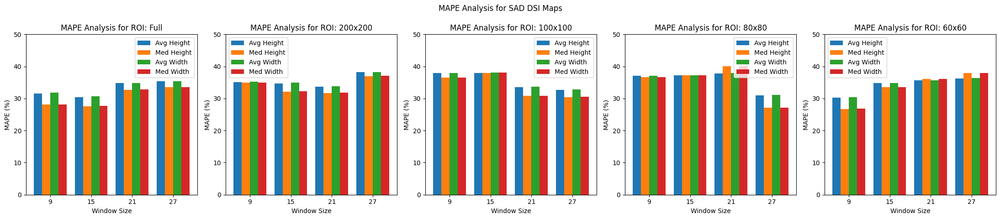

In [39]:
plot_dim_analysis(dsi_maps_SAD, title="MAPE Analysis for SAD DSI Maps")

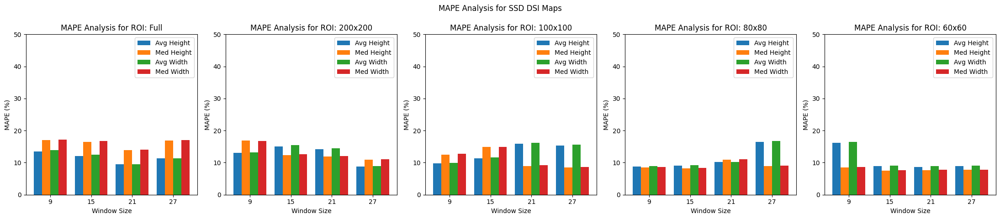

In [40]:
plot_dim_analysis(dsi_map_SSD, title="MAPE Analysis for SSD DSI Maps")

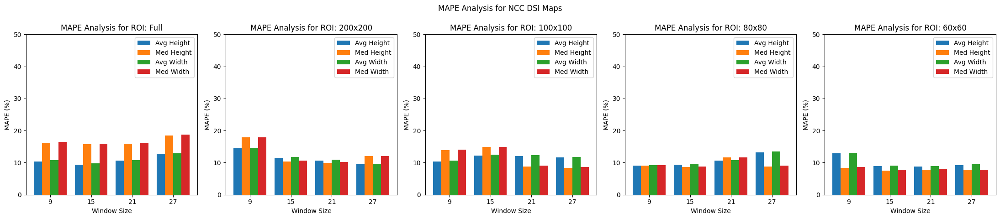

In [41]:
plot_dim_analysis(dsi_map_NCC, title="MAPE Analysis for NCC DSI Maps")

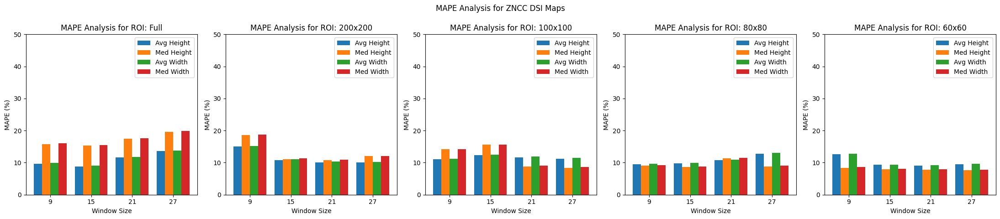

In [42]:
plot_dim_analysis(dsi_map_ZNCC, title="MAPE Analysis for ZNCC DSI Maps")

At this point, strategies were implemented to improve the results obtained. 
First, following the assignment's instructions, a more robust approach was developed to estimate the main disparity values in order to filter out outliers. 
For example, ambiguous disparity measurements were detected and removed by analyzing the function representing the dissimilarity (or similarity) measure along the disparity range. 

After some analysis, thresholds were set on the cost functions to filter out only the regions with more reliable disparity values. 
Additionally, functions that could have been more generic were instead made specific and repetitive to allow the use of Numba for pre-compiling, thus speeding up computation.

In [43]:
@numba.njit
def compute_disparity_map_SAD_cost(left_image, right_image, max_disparity, block_size, threshold):
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('inf')  # Initialize the minimum cost as positive infinity
            best_disparity = 0  # Initialize the best disparity (shift between left and right image)
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_SAD(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    if cost < min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Apply the threshold: 
            if min_cost > threshold:
                disparity_map[row, col] = -1 
            else:
                disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_SAD_cost(i, folder_path, file_nameL, file_nameR, dsi_range, window_size, threshold):
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_SAD_cost(frameL_gray, frameR_gray, dsi_range, window_size, threshold)
    return dsi 

In [44]:
dsi_map_SAD_27_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 8000) for i in range(300, 301))
dsi_map_SAD_21_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 6000) for i in range(300, 301))
dsi_map_SAD_15_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 1800) for i in range(300, 301))
dsi_map_SAD_9_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 600) for i in range(300, 301))

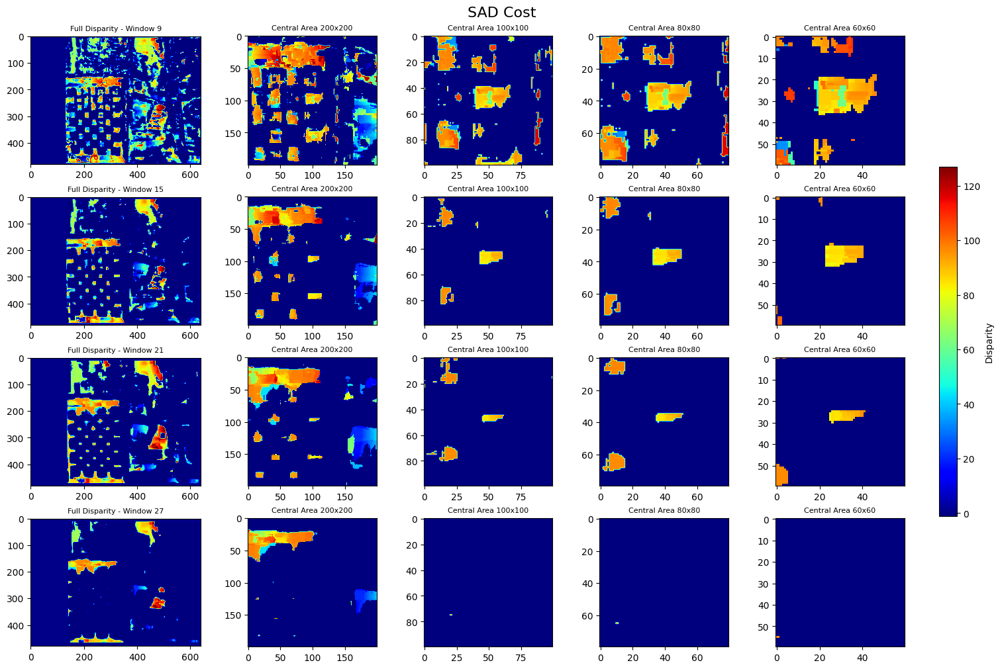

In [45]:
plot_dsi_maps(dsi_map_SAD_9_cost, dsi_map_SAD_15_cost, dsi_map_SAD_21_cost, dsi_map_SAD_27_cost, "SAD Cost", 0)

In [46]:
# Funzione per calcolare la mappa di disparità
@numba.njit
def compute_disparity_map_SSD_cost(left_image, right_image, max_disparity, block_size, threshold):
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('inf') # Initialize the minimum cost as positive infinity
            best_disparity = 0  # Initialize the best disparity (shift between left and right image)
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_SSD(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    if cost < min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Store the best disparity for the current pixel in the disparity map
            # Apply the threshold
            if min_cost > threshold:
                disparity_map[row, col] = -1 
            else:
                disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_SSD_cost(i, folder_path, file_nameL, file_nameR, dsi_range, window_size, threshold):
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_SSD_cost(frameL_gray, frameR_gray, dsi_range, window_size, threshold)
    return dsi 

In [47]:
dsi_map_SSD_27_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 30000) for i in range(300, 301))
dsi_map_SSD_21_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 20000) for i in range(300, 301))
dsi_map_SSD_15_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 10000) for i in range(300, 301))
dsi_map_SSD_9_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 3000) for i in range(300, 301))

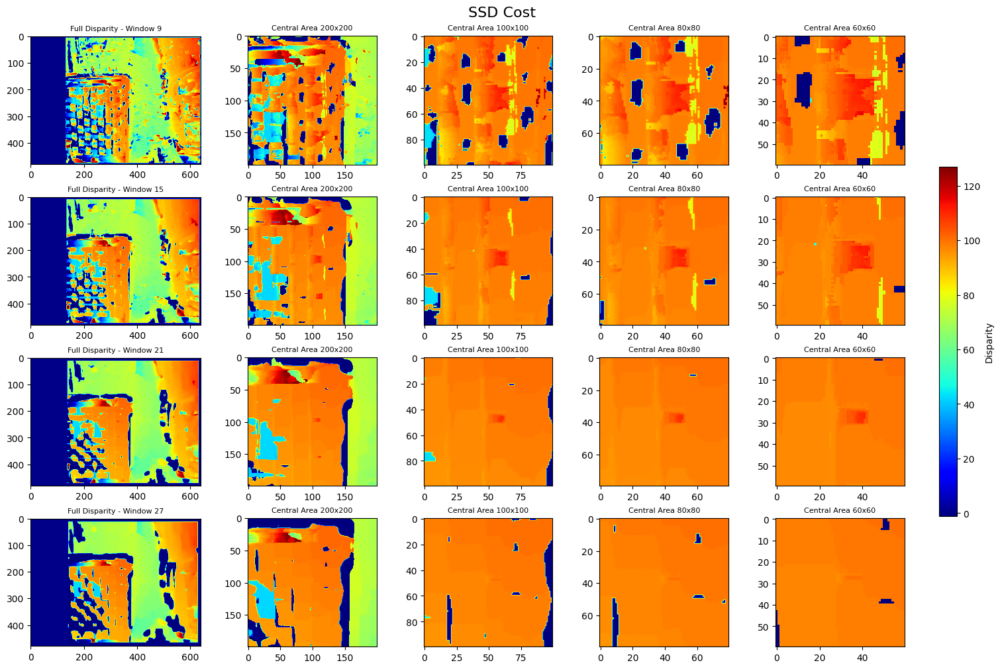

In [48]:
plot_dsi_maps(dsi_map_SSD_9_cost, dsi_map_SSD_15_cost, dsi_map_SSD_21_cost, dsi_map_SSD_27_cost, "SSD Cost", 0)

The same approach was applied, but this time using NCC (Normalized Cross-Correlation). 
Now, the thresholds were adjusted, and as specified in the introduction to NCC, the cost is evaluated between -1 and 1. 

High thresholds were chosen to effectively filter out only the most reliable disparity values.

In [49]:
@numba.njit
def compute_disparity_map_NCC_cost(left_image, right_image, max_disparity, block_size, threshold):
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('-inf') # Initialize the minimum cost as negative infinity
            best_disparity = 0  # Initialize the best disparity (shift between left and right image)
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
                    cost = compute_disparity_cost_NCC(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    if cost > min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Apply the threshold
            if min_cost < threshold:
                disparity_map[row, col] = -1 
            else:
                disparity_map[row, col] = best_disparity
    
    return disparity_map

def process_frame_NCC_cost(i, folder_path, file_nameL, file_nameR, dsi_range, window_size, threshold):
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    
    dsi = compute_disparity_map_NCC_cost(frameL_gray, frameR_gray, dsi_range, window_size, threshold)
    return dsi 

In [50]:
dsi_map_NCC_27_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 0.9) for i in range(300, 301))
dsi_map_NCC_21_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 0.9) for i in range(300, 301))
dsi_map_NCC_15_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 0.9) for i in range(300, 301))
dsi_map_NCC_9_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 0.9) for i in range(300, 301))

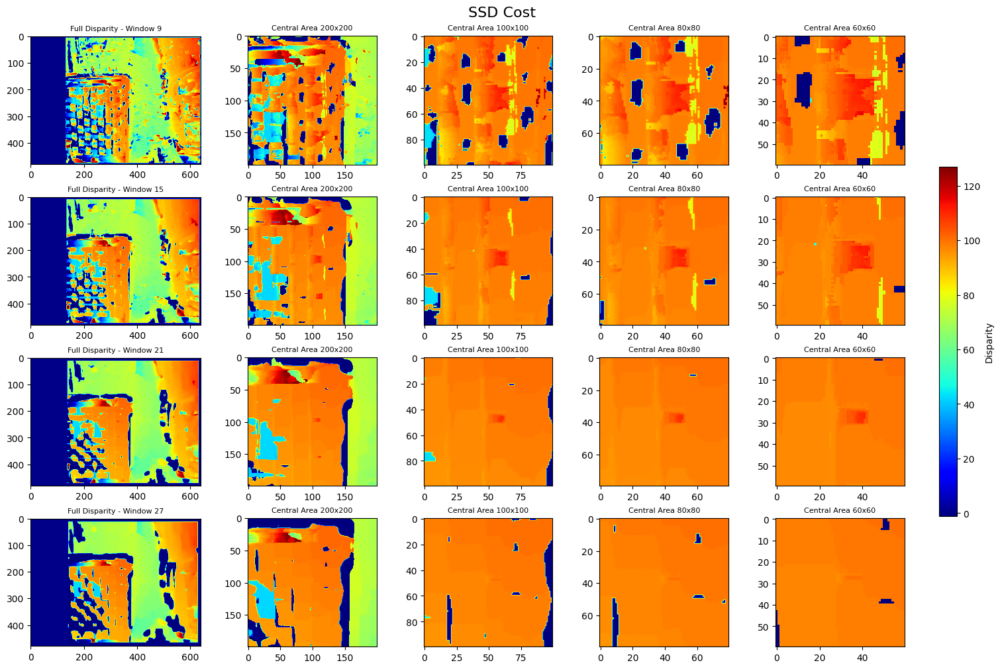

In [51]:
plot_dsi_maps(dsi_map_SSD_9_cost, dsi_map_SSD_15_cost, dsi_map_SSD_21_cost, dsi_map_SSD_27_cost, "SSD Cost", 0)

In [52]:
@numba.njit
def compute_disparity_map_ZNCC_cost(left_image, right_image, max_disparity, block_size, threshold):
    # Initialize the disparity map with the same size as the left image, filled with zeros
    disparity_map = np.zeros_like(left_image, dtype=np.float32)
    
    # Get the dimensions of the image
    image_height, image_width = left_image.shape
    
    # Define the amount of border to crop around each pixel (half the block size)
    border_margin = block_size // 2
    
    # Loop through each pixel in the left image, skipping the borders
    for row in prange(border_margin, image_height - border_margin):
        for col in range(max_disparity + border_margin, image_width - border_margin):
            min_cost = float('-inf') # Initialize the minimum cost as negative infinity
            best_disparity = 0  # Initialize the best disparity (shift between left and right image)
            
            # Loop through possible disparity values (shifts)
            for disparity in range(0, max_disparity):
                if col - disparity - border_margin >= 0:  # Ensure the pixel in the right image is within bounds
                    # Calculate the matching cost between the left and right image for the given disparity
       
                    cost = compute_disparity_cost_ZNCC(left_image, right_image, row, col, col - disparity, border_margin)
                    
                    if cost > min_cost:
                        min_cost = cost
                        best_disparity = disparity
            
            # Store the best disparity for the current pixel in the disparity map
            # Apply the threshold
            if min_cost < threshold:
                disparity_map[row, col] = -1 
            else:
                disparity_map[row, col] = best_disparity

    return disparity_map

def process_frame_ZNCC_cost(i, folder_path, file_nameL, file_nameR, dsi_range, window_size, threshold):
    videoL = cv2.VideoCapture(os.path.join(folder_path, file_nameL))
    videoR = cv2.VideoCapture(os.path.join(folder_path, file_nameR))
    
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    videoR.set(cv2.CAP_PROP_POS_FRAMES, i)

    _, frameL = videoL.read()
    _, frameR = videoR.read()
    
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)

    dsi = compute_disparity_map_ZNCC_cost(frameL_gray, frameR_gray, dsi_range, window_size, threshold)
    return dsi 

In [53]:
dsi_map_ZNCC_27_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 0.9) for i in range(300, 301))
dsi_map_ZNCC_21_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 0.9) for i in range(300, 301))
dsi_map_ZNCC_15_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 0.9) for i in range(300, 301))
dsi_map_ZNCC_9_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 0.9) for i in range(300, 301))

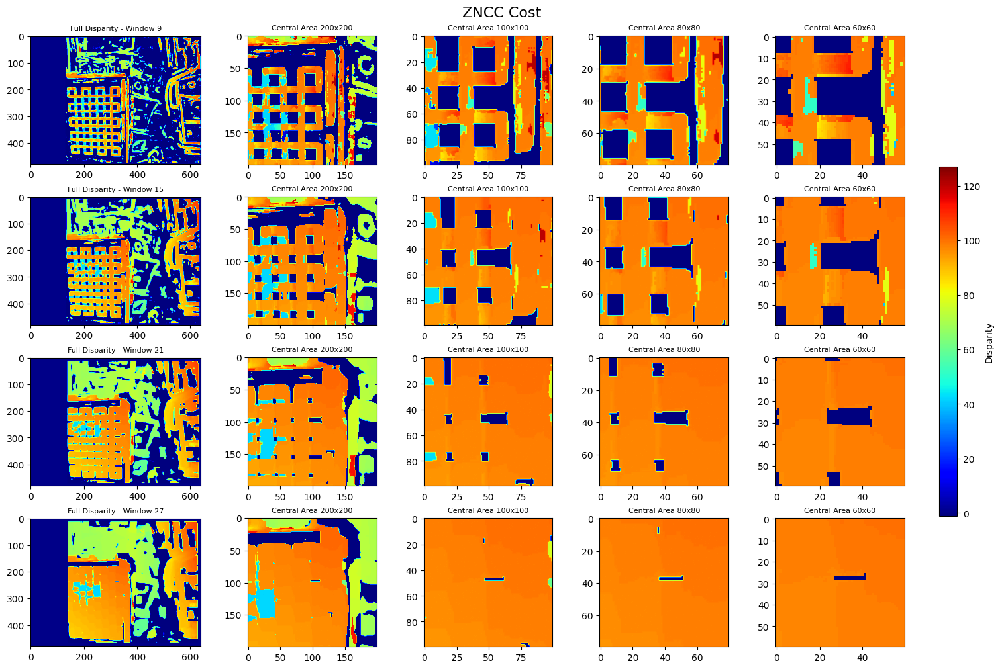

In [54]:
plot_dsi_maps(dsi_map_ZNCC_9_cost, dsi_map_ZNCC_15_cost, dsi_map_ZNCC_21_cost, dsi_map_ZNCC_27_cost, "ZNCC Cost", 0)

As before, in this case, the structures that store the disparity maps are either loaded from a file or computed and then saved. This ensures that all relevant data is readily available for further processing.

In [55]:
if not os.path.exists('all_dsi_maps_cost_v3.pkl'):
    dsi_map_SAD_27_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 8000) for i in range(0, 389))
    dsi_map_SAD_21_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 6000) for i in range(0, 389))
    dsi_map_SAD_15_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 1800) for i in range(0, 389))
    dsi_map_SAD_9_cost = Parallel(n_jobs=8)(delayed(process_frame_SAD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 600) for i in range(0, 389))
    
    dsi_map_SSD_27_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 30000) for i in range(0, 389))
    dsi_map_SSD_21_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 20000) for i in range(0, 389))
    dsi_map_SSD_15_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 10000) for i in range(0, 389))
    dsi_map_SSD_9_cost = Parallel(n_jobs=8)(delayed(process_frame_SSD_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 3000) for i in range(0, 389))
    
    dsi_map_NCC_27_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 0.9) for i in range(0, 389))
    dsi_map_NCC_21_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 0.9) for i in range(0, 389))
    dsi_map_NCC_15_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 0.9) for i in range(0, 389))
    dsi_map_NCC_9_cost = Parallel(n_jobs=8)(delayed(process_frame_NCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 0.9) for i in range(0, 389))
    
    dsi_map_ZNCC_27_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 27, 0.9) for i in range(0, 389))
    dsi_map_ZNCC_21_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 21, 0.9) for i in range(0, 389))
    dsi_map_ZNCC_15_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 15, 0.9) for i in range(0, 389))
    dsi_map_ZNCC_9_cost = Parallel(n_jobs=8)(delayed(process_frame_ZNCC_cost)(i, FOLDER_PATH, FILENAME_L, FILENAME_R, DSI_RANGE, 9, 0.9) for i in range(0, 389))
    
    with open('all_dsi_maps_cost_v3.pkl', 'wb') as file:
        pickle.dump(dsi_map_SAD_9_cost, file)
        pickle.dump(dsi_map_SAD_15_cost, file)
        pickle.dump(dsi_map_SAD_21_cost, file)
        pickle.dump(dsi_map_SAD_27_cost, file)
        pickle.dump(dsi_map_SSD_9_cost, file)
        pickle.dump(dsi_map_SSD_15_cost, file)
        pickle.dump(dsi_map_SSD_21_cost, file)
        pickle.dump(dsi_map_SSD_27_cost, file)
        pickle.dump(dsi_map_NCC_9_cost, file)
        pickle.dump(dsi_map_NCC_15_cost, file)
        pickle.dump(dsi_map_NCC_21_cost, file)
        pickle.dump(dsi_map_NCC_27_cost, file)
        pickle.dump(dsi_map_ZNCC_9_cost, file)
        pickle.dump(dsi_map_ZNCC_15_cost, file)
        pickle.dump(dsi_map_ZNCC_21_cost, file)
        pickle.dump(dsi_map_ZNCC_27_cost, file)

else:
    with open('all_dsi_maps_cost_v3.pkl', 'rb') as file:
        dsi_map_SAD_9_cost = pickle.load(file)
        dsi_map_SAD_15_cost = pickle.load(file)
        dsi_map_SAD_21_cost = pickle.load(file)
        dsi_map_SAD_27_cost = pickle.load(file)
        dsi_map_SSD_9_cost = pickle.load(file)
        dsi_map_SSD_15_cost = pickle.load(file)
        dsi_map_SSD_21_cost = pickle.load(file)
        dsi_map_SSD_27_cost = pickle.load(file)
        dsi_map_NCC_9_cost = pickle.load(file)
        dsi_map_NCC_15_cost = pickle.load(file)
        dsi_map_NCC_21_cost = pickle.load(file)
        dsi_map_NCC_27_cost = pickle.load(file)
        dsi_map_ZNCC_9_cost = pickle.load(file)
        dsi_map_ZNCC_15_cost = pickle.load(file)
        dsi_map_ZNCC_21_cost = pickle.load(file)
        dsi_map_ZNCC_27_cost = pickle.load(file)

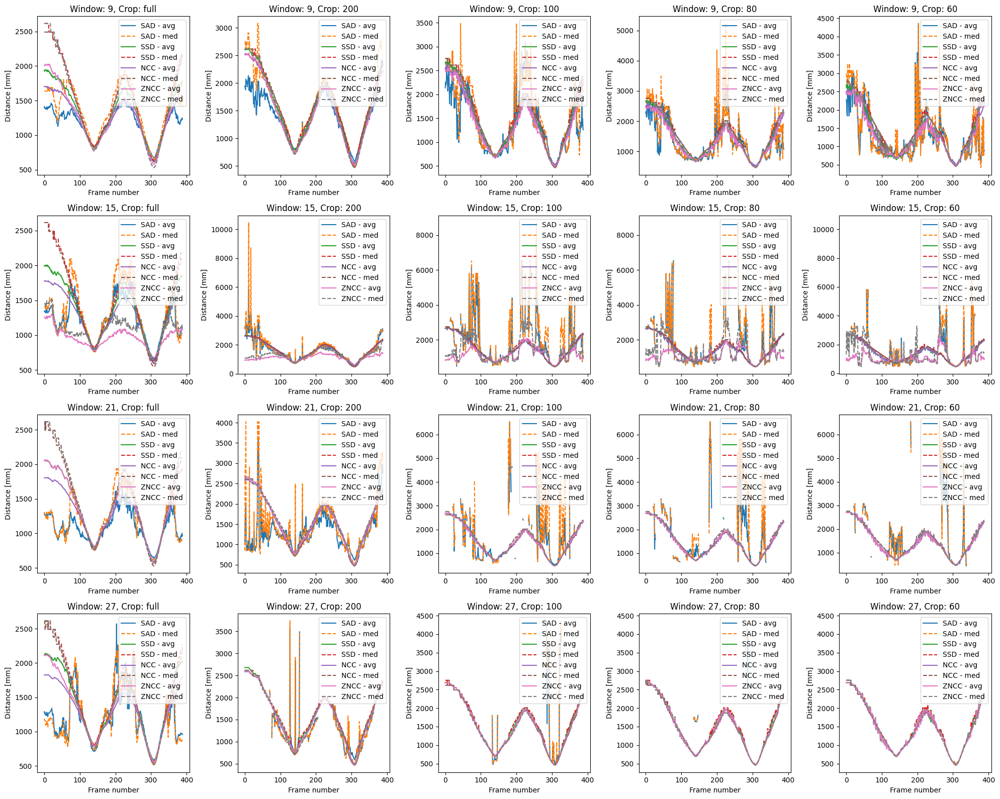

In [56]:
dsi_dict_cost = {}

dsi_processing(dsi_dict_cost, dsi_map_SAD_9_cost, dsi_map_SAD_15_cost, dsi_map_SAD_21_cost, dsi_map_SAD_27_cost, "SAD")
dsi_processing(dsi_dict_cost, dsi_map_SSD_9_cost, dsi_map_SSD_15_cost, dsi_map_SSD_21_cost, dsi_map_SSD_27_cost, "SSD")
dsi_processing(dsi_dict_cost, dsi_map_NCC_9_cost, dsi_map_NCC_15_cost, dsi_map_NCC_21_cost, dsi_map_NCC_27_cost, "NCC")
dsi_processing(dsi_dict_cost, dsi_map_ZNCC_9_cost, dsi_map_ZNCC_15_cost, dsi_map_ZNCC_21_cost, dsi_map_ZNCC_27_cost, "ZNCC")

dist_dict_cost = dist_processing(dsi_dict_cost)

plot_distance_metrics(dist_dict_cost)

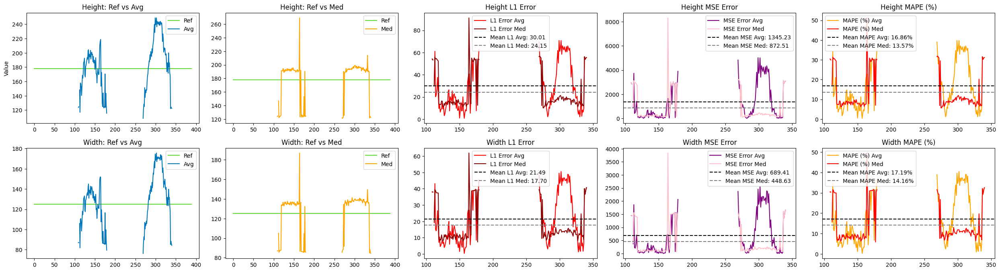

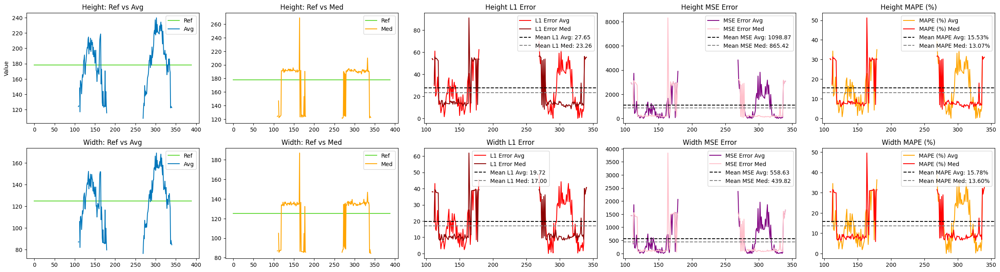

In [57]:
dsi_maps = [dsi_map_ZNCC_15_cost, roi_mask(dsi_map_ZNCC_15_cost, 200)]

# Iterate over each DSI map
for dsi_map in dsi_maps:
    height, height_med, width, width_med = [], [], [], []
    videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)

    # Iterate through frames in the video to calculate dimensions
    for i in range(frame_countL):
        ret, frameL = videoL.read()
        if not ret:
            break

        # Find the corners and crop the DSI map to the chessboard
        cornersL = find_chessboard_corners(frameL, PATTERN_SIZE)
        chessboardL = crop_chessboard(dsi_map[i], cornersL)

        # Calculate the height and width of the chessboard
        h, h_med, w, w_med = get_height_width(chessboardL, FOCAL_LENGTH, BASELINE)
        height.append(h)
        height_med.append(h_med)
        width.append(w)
        width_med.append(w_med)

    # Calculate error metrics
    width_data = {"avg": width, "med": width_med}
    height_data = {"avg": height, "med": height_med}
    error_metrics = dim_analysis(width_data, height_data, REF_WIDTH, REF_HEIGHT)

    # Check if results lists contain data, then plot results
    if height and height_med and width and width_med:
        time = range(len(height))  # Use `len(height)` to match the length with the data
        plot_results_over_time(
            time, REF_WIDTH, REF_HEIGHT,
            {"width": width, "height": height},
            {"width": width_med, "height": height_med},
            error_metrics, ""
        )
    else:
        print("The dimension lists are empty or incomplete for this DSI map.")

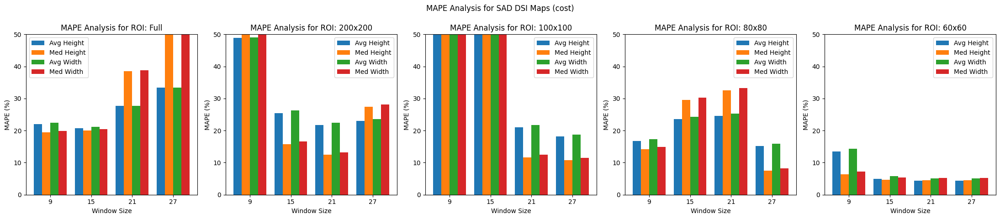

In [58]:
dsi_maps_SAD_cost = [dsi_map_SAD_9_cost, roi_mask(dsi_map_SAD_9_cost, 200), roi_mask(dsi_map_SAD_9_cost, 100), roi_mask(dsi_map_SAD_9_cost, 80), roi_mask(dsi_map_SAD_9_cost, 60),
                     dsi_map_SAD_15_cost, roi_mask(dsi_map_SAD_15_cost, 200), roi_mask(dsi_map_SAD_15_cost, 100), roi_mask(dsi_map_SAD_15_cost, 80), roi_mask(dsi_map_SAD_15_cost, 60),
                     dsi_map_SAD_21_cost, roi_mask(dsi_map_SAD_21_cost, 200), roi_mask(dsi_map_SAD_21_cost, 100), roi_mask(dsi_map_SAD_21_cost, 80), roi_mask(dsi_map_SAD_21_cost, 60),
                     dsi_map_SAD_27_cost, roi_mask(dsi_map_SAD_27_cost, 200), roi_mask(dsi_map_SAD_27_cost, 100), roi_mask(dsi_map_SAD_27_cost, 80), roi_mask(dsi_map_SAD_27_cost, 60)]

plot_dim_analysis(dsi_maps_SAD_cost, title="MAPE Analysis for SAD DSI Maps (cost)")


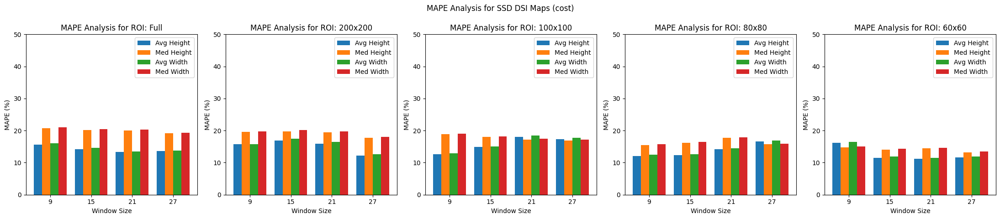

In [59]:
dsi_maps_SSD_cost = [dsi_map_SSD_9_cost, roi_mask(dsi_map_SSD_9_cost, 200), roi_mask(dsi_map_SSD_9_cost, 100), roi_mask(dsi_map_SSD_9_cost, 80), roi_mask(dsi_map_SSD_9_cost, 60),
                     dsi_map_SSD_15_cost, roi_mask(dsi_map_SSD_15_cost, 200), roi_mask(dsi_map_SSD_15_cost, 100), roi_mask(dsi_map_SSD_15_cost, 80), roi_mask(dsi_map_SSD_15_cost, 60),
                     dsi_map_SSD_21_cost, roi_mask(dsi_map_SSD_21_cost, 200), roi_mask(dsi_map_SSD_21_cost, 100), roi_mask(dsi_map_SSD_21_cost, 80), roi_mask(dsi_map_SSD_21_cost, 60),
                     dsi_map_SSD_27_cost, roi_mask(dsi_map_SSD_27_cost, 200), roi_mask(dsi_map_SSD_27_cost, 100), roi_mask(dsi_map_SSD_27_cost, 80), roi_mask(dsi_map_SSD_27_cost, 60)]

plot_dim_analysis(dsi_maps_SSD_cost, title="MAPE Analysis for SSD DSI Maps (cost)")

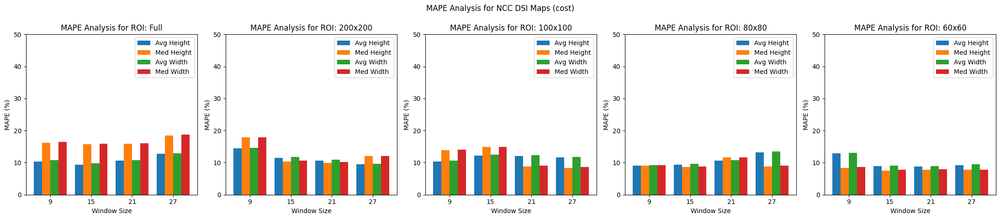

In [60]:
dsi_maps_NCC_cost = [dsi_map_NCC_9_cost, roi_mask(dsi_map_NCC_9_cost, 200), roi_mask(dsi_map_NCC_9_cost, 100), roi_mask(dsi_map_NCC_9_cost, 80), roi_mask(dsi_map_NCC_9_cost, 60),
                     dsi_map_NCC_15_cost, roi_mask(dsi_map_NCC_15_cost, 200), roi_mask(dsi_map_NCC_15_cost, 100), roi_mask(dsi_map_NCC_15_cost, 80), roi_mask(dsi_map_NCC_15_cost, 60),
                     dsi_map_NCC_21_cost, roi_mask(dsi_map_NCC_21_cost, 200), roi_mask(dsi_map_NCC_21_cost, 100), roi_mask(dsi_map_NCC_21_cost, 80), roi_mask(dsi_map_NCC_21_cost, 60),
                     dsi_map_NCC_27_cost, roi_mask(dsi_map_NCC_27_cost, 200), roi_mask(dsi_map_NCC_27_cost, 100), roi_mask(dsi_map_NCC_27_cost, 80), roi_mask(dsi_map_NCC_27_cost, 60)]

plot_dim_analysis(dsi_maps_NCC_cost, title="MAPE Analysis for NCC DSI Maps (cost)")

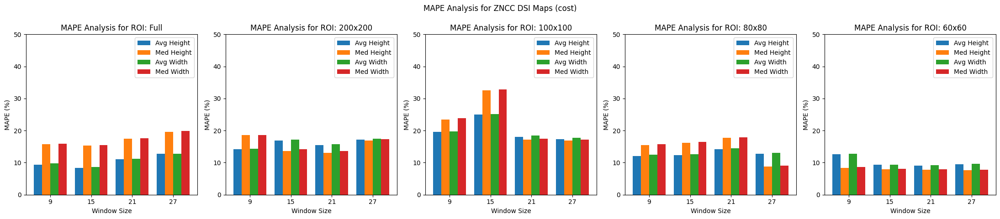

In [61]:
dsi_maps_ZNCC_cost = [dsi_map_ZNCC_9_cost, roi_mask(dsi_map_ZNCC_9_cost, 200), roi_mask(dsi_map_ZNCC_9_cost, 100), roi_mask(dsi_map_ZNCC_9_cost, 80), roi_mask(dsi_map_ZNCC_9_cost, 60),
                        dsi_map_ZNCC_15_cost, roi_mask(dsi_map_ZNCC_15_cost, 200), roi_mask(dsi_map_ZNCC_15_cost, 100), roi_mask(dsi_map_ZNCC_15_cost, 80), roi_mask(dsi_map_ZNCC_15_cost, 60),
                        dsi_map_ZNCC_21_cost, roi_mask(dsi_map_ZNCC_21_cost, 200), roi_mask(dsi_map_ZNCC_21_cost, 100), roi_mask(dsi_map_ZNCC_21_cost, 80), roi_mask(dsi_map_ZNCC_21_cost, 60),
                        dsi_map_ZNCC_27_cost, roi_mask(dsi_map_ZNCC_27_cost, 200), roi_mask(dsi_map_ZNCC_27_cost, 100), roi_mask(dsi_map_ZNCC_27_cost, 80), roi_mask(dsi_map_ZNCC_27_cost, 60)]

plot_dim_analysis(dsi_maps_ZNCC_cost, title="MAPE Analysis for ZNCC DSI Maps (cost)")

The Moravec operator is a corner detection technique that identifies high-textured areas by measuring the variation in intensity around a given pixel. To evaluate the "cornerness" of a point, Moravec’s method compares a small patch centered on the point of interest with several shifted patches around it. 
By translating the original patch a few pixels in various directions and calculating the pixel-wise difference between the original and shifted patches, the operator quantifies how much the intensity changes in each direction.

When there is a significant difference in intensity between the patches in multiple directions, the point is likely a corner. 
This high difference in all directions suggests complex texture in the area, as opposed to edges (where the difference would be high in one direction only) or flat regions (where the difference is low in all directions).

In [62]:
@numba.njit
def moravec_operator(gray, window_size=3, threshold=8500):
    """
    Apply the Moravec operator to detect corner points in a grayscale image
    and create a binary mask for points above the threshold.
    
    Args:
        gray (np-array): Input grayscale image.
        window_size (int): Size of the window for corner detection.
        threshold (float): Threshold for Moravec response to identify corner points.

    Returns:
        corners (np-array): Array of corner coordinates above the threshold.
        moravec_response (np-array): Moravec response for each pixel.
        corner_mask (np-array): Binary mask where 1 = corner point, 0 = non-corner.
    """
    h, w = gray.shape
    moravec_response = np.zeros((h, w))
    # Initialize binary mask
    corner_mask = np.zeros((h, w), dtype=np.uint8)  

    offsets = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]

    for y in range(window_size, h - window_size):
        for x in range(window_size, w - window_size):
            min_sad = float('inf')

            for offset in offsets:
                sad = 0
                for dy in range(-window_size, window_size + 1):
                    for dx in range(-window_size, window_size + 1):
                        i1 = gray[y + dy, x + dx]
                        i2 = gray[y + dy + offset[1], x + dx + offset[0]]
                        sad += (i1 - i2) ** 2

                if sad < min_sad:
                    min_sad = sad

            moravec_response[y, x] = min_sad

            # Update the mask for corner points above the threshold
            if min_sad > threshold:
                corner_mask[y, x] = 1

    corners = np.argwhere(moravec_response > threshold)

    return corners, moravec_response, corner_mask

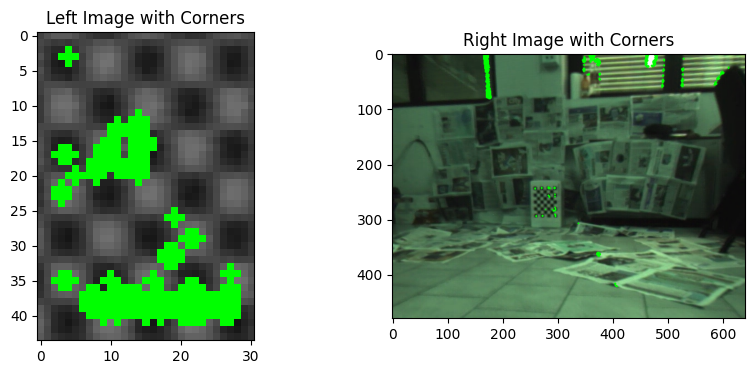

In [63]:
# Load the videos and read frames
videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)
for i in range(0, 30):
    _, frameL = videoL.read()
    _, frameR = videoR.read()

# Convert frames to grayscale
frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
frameR_gray = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)

# Crop the chessboard area
corners = find_chessboard_corners(frameL, PATTERN_SIZE)
frameL_gray = crop_chessboard(frameL_gray, corners)

img_left = frameL.copy()  # Keep original color for drawing
img_right = frameR.copy()  # Keep original color for drawing

# Apply the Moravec operator to detect corners
corners_left, response_left, _ = moravec_operator(frameL_gray)
corners_right, response_right, _ = moravec_operator(frameR_gray)

# Convert the grayscale frame back to color for display purposes
frameL_gray = cv2.cvtColor(frameL_gray, cv2.COLOR_GRAY2BGR)

# Draw circles on detected corners in green
for corner in corners_left:
    cv2.circle(frameL_gray, (corner[1], corner[0]), 1, (0, 255, 0), -1)

for corner in corners_right:
    cv2.circle(img_right, (corner[1], corner[0]), 1, (0, 255, 0), -1)
    
plot_stereo_images(frameL_gray, img_right, 'Left Image with Corners', 'Right Image with Corners')


Different tresholds were tested in order to find the one that could suit best the project's needes. 

In [64]:
moravec_masks_8500 = []
videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)
for i in range (0, 389):
    # set the video to the i frame 
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    _, frameL = videoL.read()
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    corners, response, mask = moravec_operator(frameL_gray)
    moravec_masks_8500.append(mask)

moravec_masks_8000 = []
videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)
for i in range (0, 389):
    # set the video to the i frame 
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    _, frameL = videoL.read()
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    corners, response, mask = moravec_operator(frameL_gray, threshold=8000)
    moravec_masks_8000.append(mask)
    
moravec_masks_7500 = []
videoL, videoR = load_videos(FOLDER_PATH, FILENAME_L, FILENAME_R)
for i in range (0, 389):
    # set the video to the i frame 
    videoL.set(cv2.CAP_PROP_POS_FRAMES, i)
    _, frameL = videoL.read()
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    corners, response, mask = moravec_operator(frameL_gray, threshold=7500)
    moravec_masks_7500.append(mask)

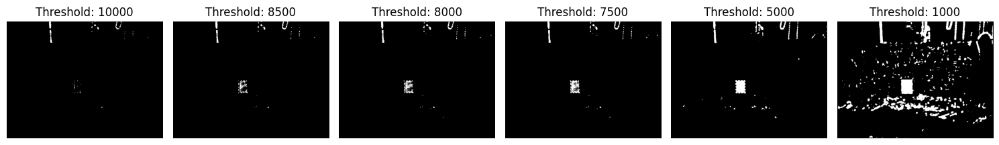

In [65]:
def process_video_for_threshold(videoL, threshold):
    masks = []
    # Set video to first frame
    videoL.set(cv2.CAP_PROP_POS_FRAMES, 0)  
    _, frameL = videoL.read()
    frameL_gray = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    
    # Apply Moravec operator (assuming moravec_operator function is defined)
    corners, response, mask = moravec_operator(frameL_gray, threshold=threshold)
    masks.append(mask)  # Append the mask of the first frame only
    return masks

# Define thresholds to test
thresholds = [10000, 8500, 8000, 7500, 5000, 1000]

# Apply process_video_for_threshold to each threshold and store results in a dictionary
moravec_masks = {threshold: process_video_for_threshold(videoL, threshold)[0] for threshold in thresholds}

# Display each mask for the first frame with different thresholds in a single row
fig, axs = plt.subplots(1, len(thresholds), figsize=(15, 5))

for i, threshold in enumerate(thresholds):
    axs[i].imshow(moravec_masks[threshold], cmap='gray')
    axs[i].set_title(f'Threshold: {threshold}')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

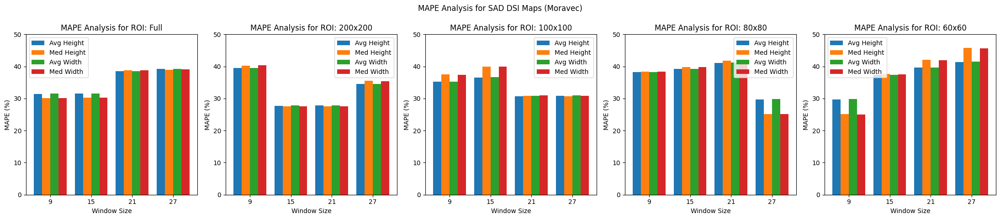

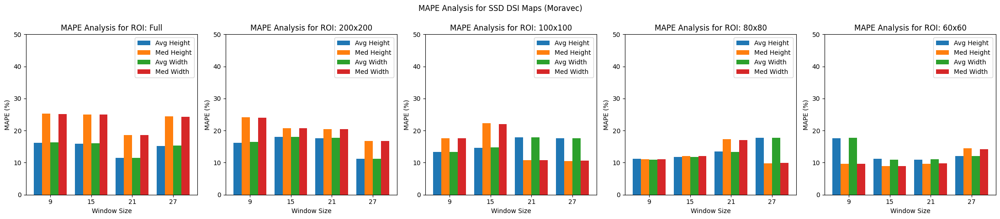

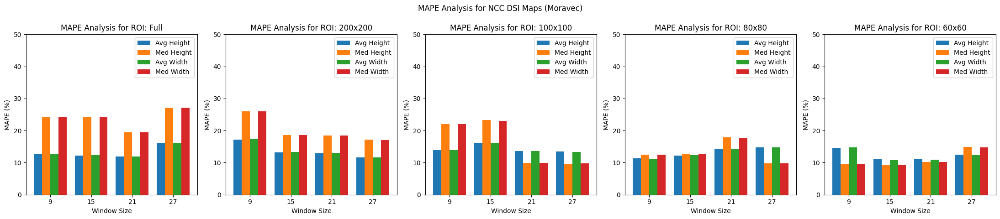

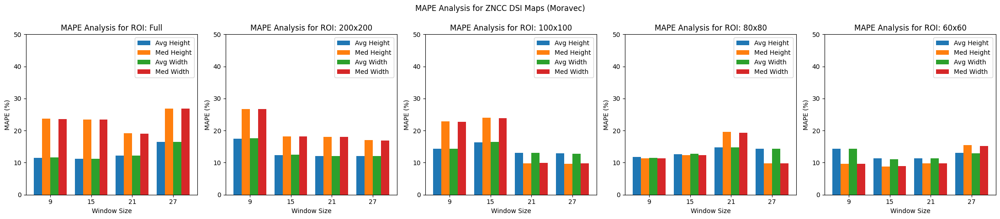

In [66]:
dsi_maps_SAD = [
    dsi_map_SAD_9, roi_mask(dsi_map_SAD_9, 200), roi_mask(dsi_map_SAD_9, 100), roi_mask(dsi_map_SAD_9, 80), roi_mask(dsi_map_SAD_9, 60),
    dsi_map_SAD_15, roi_mask(dsi_map_SAD_15, 200), roi_mask(dsi_map_SAD_15, 100), roi_mask(dsi_map_SAD_15, 80), roi_mask(dsi_map_SAD_15, 60),
    dsi_map_SAD_21, roi_mask(dsi_map_SAD_21, 200), roi_mask(dsi_map_SAD_21, 100), roi_mask(dsi_map_SAD_21, 80), roi_mask(dsi_map_SAD_21, 60),
    dsi_map_SAD_27, roi_mask(dsi_map_SAD_27, 200), roi_mask(dsi_map_SAD_27, 100), roi_mask(dsi_map_SAD_27, 80), roi_mask(dsi_map_SAD_27, 60)
]

dsi_map_SSD = [
    dsi_map_SSD_9, roi_mask(dsi_map_SSD_9, 200), roi_mask(dsi_map_SSD_9, 100), roi_mask(dsi_map_SSD_9, 80), roi_mask(dsi_map_SSD_9, 60),
    dsi_map_SSD_15, roi_mask(dsi_map_SSD_15, 200), roi_mask(dsi_map_SSD_15, 100), roi_mask(dsi_map_SSD_15, 80), roi_mask(dsi_map_SSD_15, 60),
    dsi_map_SSD_21, roi_mask(dsi_map_SSD_21, 200), roi_mask(dsi_map_SSD_21, 100), roi_mask(dsi_map_SSD_21, 80), roi_mask(dsi_map_SSD_21, 60),
    dsi_map_SSD_27, roi_mask(dsi_map_SSD_27, 200), roi_mask(dsi_map_SSD_27, 100), roi_mask(dsi_map_SSD_27, 80), roi_mask(dsi_map_SSD_27, 60)
]

dsi_map_NCC = [
    dsi_map_NCC_9, roi_mask(dsi_map_NCC_9, 200), roi_mask(dsi_map_NCC_9, 100), roi_mask(dsi_map_NCC_9, 80), roi_mask(dsi_map_NCC_9, 60),
    dsi_map_NCC_15, roi_mask(dsi_map_NCC_15, 200), roi_mask(dsi_map_NCC_15, 100), roi_mask(dsi_map_NCC_15, 80), roi_mask(dsi_map_NCC_15, 60),
    dsi_map_NCC_21, roi_mask(dsi_map_NCC_21, 200), roi_mask(dsi_map_NCC_21, 100), roi_mask(dsi_map_NCC_21, 80), roi_mask(dsi_map_NCC_21, 60),
    dsi_map_NCC_27, roi_mask(dsi_map_NCC_27, 200), roi_mask(dsi_map_NCC_27, 100), roi_mask(dsi_map_NCC_27, 80), roi_mask(dsi_map_NCC_27, 60)
]

dsi_map_ZNCC = [
    dsi_map_ZNCC_9, roi_mask(dsi_map_ZNCC_9, 200), roi_mask(dsi_map_ZNCC_9, 100), roi_mask(dsi_map_ZNCC_9, 80), roi_mask(dsi_map_ZNCC_9, 60),
    dsi_map_ZNCC_15, roi_mask(dsi_map_ZNCC_15, 200), roi_mask(dsi_map_ZNCC_15, 100), roi_mask(dsi_map_ZNCC_15, 80), roi_mask(dsi_map_ZNCC_15, 60),
    dsi_map_ZNCC_21, roi_mask(dsi_map_ZNCC_21, 200), roi_mask(dsi_map_ZNCC_21, 100), roi_mask(dsi_map_ZNCC_21, 80), roi_mask(dsi_map_ZNCC_21, 60),
    dsi_map_ZNCC_27, roi_mask(dsi_map_ZNCC_27, 200), roi_mask(dsi_map_ZNCC_27, 100), roi_mask(dsi_map_ZNCC_27, 80), roi_mask(dsi_map_ZNCC_27, 60)
]


for dsi in dsi_maps_SAD:
    for i in range (0, 389):
        dsi[i] = np.multiply(dsi[i], moravec_masks_8500[i])

for dsi in dsi_map_SSD:
    for i in range (0, 389):
        dsi[i] = np.multiply(dsi[i], moravec_masks_8500[i])

for dsi in dsi_map_NCC:
    for i in range (0, 389):
        dsi[i] = np.multiply(dsi[i], moravec_masks_8500[i])

for dsi in dsi_map_ZNCC:
    for i in range (0, 389):
        dsi[i] = np.multiply(dsi[i], moravec_masks_8500[i])

plot_dim_analysis(dsi_maps_SAD, title="MAPE Analysis for SAD DSI Maps (Moravec)")
plot_dim_analysis(dsi_map_SSD, title="MAPE Analysis for SSD DSI Maps (Moravec)")
plot_dim_analysis(dsi_map_NCC, title="MAPE Analysis for NCC DSI Maps (Moravec)")
plot_dim_analysis(dsi_map_ZNCC, title="MAPE Analysis for ZNCC DSI Maps (Moravec)")

In this implementation, the aim was to analyze the spatial positioning of an obstacle relative to a stereo camera system by dividing the primary disparity map into several vertical strips. 
After determining the main disparity values (by computing both the average and the median) for each strip, the angle between the obstacle’s horizontal lines and the stereo sensor’s image plane is computed.

Subsequently a plot for this angle, as a function of frame number, was created to observe its variation over time. 

At the end, a simplified bird's-eye view (BEV) representation of the obstacle was made, considering the chessboard as a line and using the found angle to rotate it in the space. 

In [67]:
def crop_strips_with_perspective(dsi_map, folder_path=FOLDER_PATH, filename_L=FILENAME_L, filename_R=FILENAME_R, pattern_size=PATTERN_SIZE, strip_number=STRIPS):
    
    # Load stereo video files
    videoL, videoR = load_videos(folder_path, filename_L, filename_R)
    
    # Dictionary to store average and median angles (tau)
    tau = {"avg": [], "med": []}
    
    # Loop through frames (from frame 0 to 388)
    for i in range(0, 389):
        # Read the next frame from the left video
        _, frameL = videoL.read()
        
        # Find the chessboard corners in the left frame
        cornersL = find_chessboard_corners(frameL, pattern_size)
        
        # Crop the disparity map based on chessboard corners
        chessboardL = crop_chessboard(dsi_map[i], cornersL)
        
        # Crop the left frame to obtain the chessboard area
        imgchessboard = crop_chessboard(frameL, cornersL)
        
        # Assign the entire left frame to chessboardL for strip division
        chessboardL = frameL
        
        # Function to divide the image into vertical strips
        def divide_in_strips(image, num_strips=strip_number):
            if image is not None:
                h, w = image.shape[:2]
                strip_width = w // num_strips
                strips = []
                
                # Loop to create strips
                for j in range(num_strips):
                    strip = image[:, j * strip_width:(j + 1) * strip_width]
                    strips.append(strip)
                return strips
            else:
                return []
        
        # Divide the chessboard region into vertical strips
        strips = divide_in_strips(chessboardL)
        
        # Dictionary to store average and median distances for each strip
        dist = {"avg": [], "med": []}
        
        # List to store the width of each strip
        width = []
        
        # Loop through each strip to calculate distance metrics
        for stp in strips:
            # Calculate the average and median DSI values for the strip (only non-zero pixels)
            avg_dsi = get_avg_dsi(stp[stp > 0])
            med_dsi = get_med_dsi(stp[stp > 0])
            
            # Convert the DSI values to distances
            avg_dist = get_distance(avg_dsi)
            med_dist = get_distance(med_dsi)
            
            # Append distances to the respective lists
            dist["avg"].append(avg_dist)
            dist["med"].append(med_dist)
            
            # Calculate the width of each strip and add it to the width list
            _, _, w, _ = get_height_width(stp, FOCAL_LENGTH, BASELINE)
            width.append(w)
        
        # Calculate the total width of all strips
        full_width = sum(width)
        
        # Calculate the angle tau (only if avg distances are available)
        if len(dist["avg"]) > 0:
            full_distance_avg = max(dist["avg"]) - min(dist["avg"])
            tau_avg = atan((full_distance_avg) / (full_width)) * 180 / pi
            
            # Append the calculated angle to the tau dictionary
            tau["avg"].append(tau_avg)

    return tau

def plot_tau(list):
    # Plot the angle tau as a function of frame number
    plt.plot(range(len(list)), list, label="Angle tau")
    plt.xlabel("Frame Number")
    plt.ylabel("Angle tau (degrees)")
    plt.title("Angle tau as a function of frame number")
    plt.legend()
    plt.show()

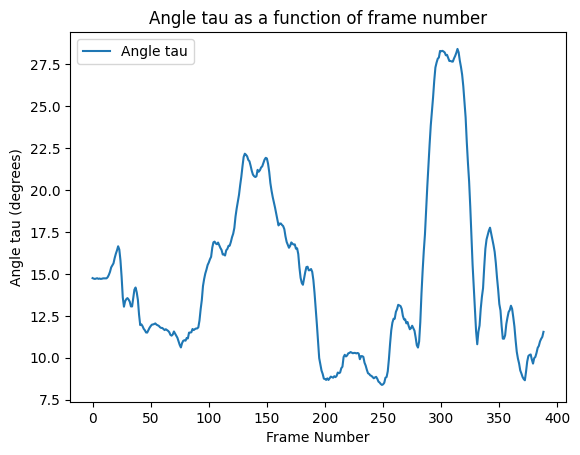

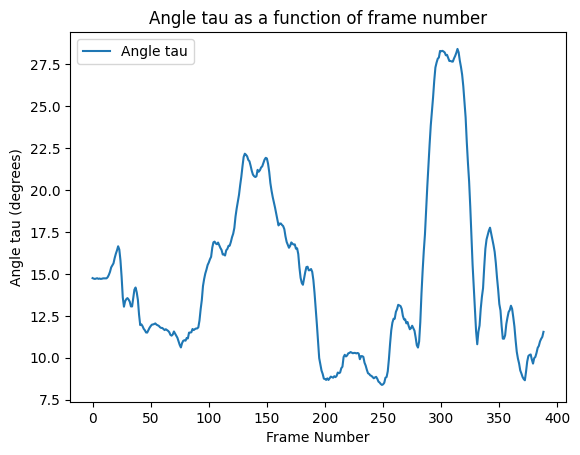

In [68]:
tau_ZNCC_21 = crop_strips_with_perspective(dsi_map_ZNCC_21)
plot_tau(tau_ZNCC_21["avg"])

tau_SSD_15 = crop_strips_with_perspective(dsi_map_SSD_15)
plot_tau(tau_SSD_15["avg"])